In [2]:
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
import random
import seaborn as sns
import pandas as pd
import numpy as np

# Profiles analysis to text Diversity, Richness and Evenness

Combining data for patients profiles into one JSON file

In [3]:
# Function to prepare data
def prepare_data(profiles):
    prepared_data = []
    for idx, profile in enumerate(profiles):
        patient_data = {
            "Patient Number": idx + 1,
            "Profile": profile.get("profile", ""),
            "Age": profile["characteristics"].get("Age", ""),
            "Gender": profile["characteristics"].get("Gender", ""),
            "Ethnicity": profile["characteristics"].get("Ethnicity", ""),
            "Education": profile["characteristics"].get("Education", ""),
            "Occupation": profile["characteristics"].get("Occupation", ""),
            "Symptom_Severity": profile["characteristics"].get("Symptom_Severity", ""),
            "Engagement_Level": profile["characteristics"].get("Engagement_Level", ""),
            "Life_Events": "-".join(profile["characteristics"].get("Life_Events", [])),
            "Family_Background": profile["characteristics"].get("Family_Background", ""),
            "Hobbies_Interests": "-".join(profile["characteristics"].get("Hobbies_Interests", [])),
            "Social_Support": profile["characteristics"].get("Social_Support", ""),
            "Personality_Traits": "-".join(profile["characteristics"].get("Personality_Traits", [])),
            "Coping_Mechanisms": "-".join(profile["characteristics"].get("Coping_Mechanisms", []))
        }
        prepared_data.append(patient_data)
    return prepared_data

# Initialize an empty list to store all profiles
combined_profiles = []

# Loop through all depression_set folders from 1 to 58
for i in range(1, 59):
    folder_name = f"Synthetic_Transcripts/depression_set_{i}"
    file_path = os.path.join(folder_name, "patient_profile.json")

    # Check if the file exists
    if os.path.exists(file_path):
        # Read the JSON file
        with open(file_path, 'r') as f:
            profile_data = json.load(f)
            combined_profiles.append(profile_data)

Prepare data as csv dataframe

In [4]:
# Prepare the data
prepared_profiles = prepare_data(combined_profiles)

# Convert the prepared profiles list to a DataFrame
df = pd.DataFrame(prepared_profiles)

# Save the combined profiles to a JSON file
with open('combined_profiles.json', 'w') as f:
    json.dump(prepared_profiles, f, indent=4)

# Save the DataFrame to a CSV file
df.to_csv('combined_profiles.csv', index=False)

# Display the DataFrame
print(df)

Empty DataFrame
Columns: []
Index: []


In [ ]:
#incase you run the previouse code before and you don't want to run it again
# Load the DataFrame from the CSV file
df = pd.read_csv('combined_profiles.csv')

ensure correct data coding

In [ ]:
# Mapping the categorical variables to numerical values
age_mapping = {"18-25": 1, "26-35": 2, "36-45": 3, "46-55": 4, "56-65": 5, "66+": 6}
gender_mapping = {"Male": 1, "Female": 2, "Non-binary": 3, "Transgender": 4, "Other": 5}
ethnicity_mapping = {"Caucasian": 1, "African American": 2, "Hispanic": 3, "Asian": 4, "Middle Eastern": 5, "South Asian": 6, "Other": 7}
education_mapping = {"High School": 1, "Some College": 2, "Bachelor's Degree": 3, "Master's Degree": 4, "Doctoral Degree": 5}
occupation_mapping = {"Blue-collar worker": 1, "White-collar worker": 2, "Self-employed": 3, "Student": 4, "Retired": 5, "Unemployed": 6}
symptom_severity_mapping = {"Mild": 0, "Moderate": 1, "Severe": 2}
engagement_level_mapping = {"Low": 0, "Medium": 1, "High": 2}

# Apply the mappings to the DataFrame
# Create new columns with mapped numerical values
df['Age_Mapped'] = df['Age'].map(age_mapping)
df['Gender_Mapped'] = df['Gender'].map(gender_mapping)
df['Ethnicity_Mapped'] = df['Ethnicity'].map(ethnicity_mapping)
df['Education_Mapped'] = df['Education'].map(education_mapping)
df['Occupation_Mapped'] = df['Occupation'].map(occupation_mapping)
df['Symptom_Severity_Mapped'] = df['Symptom_Severity'].map(symptom_severity_mapping)
df['Engagement_Level_Mapped'] = df['Engagement_Level'].map(engagement_level_mapping)

## Ploting profile data

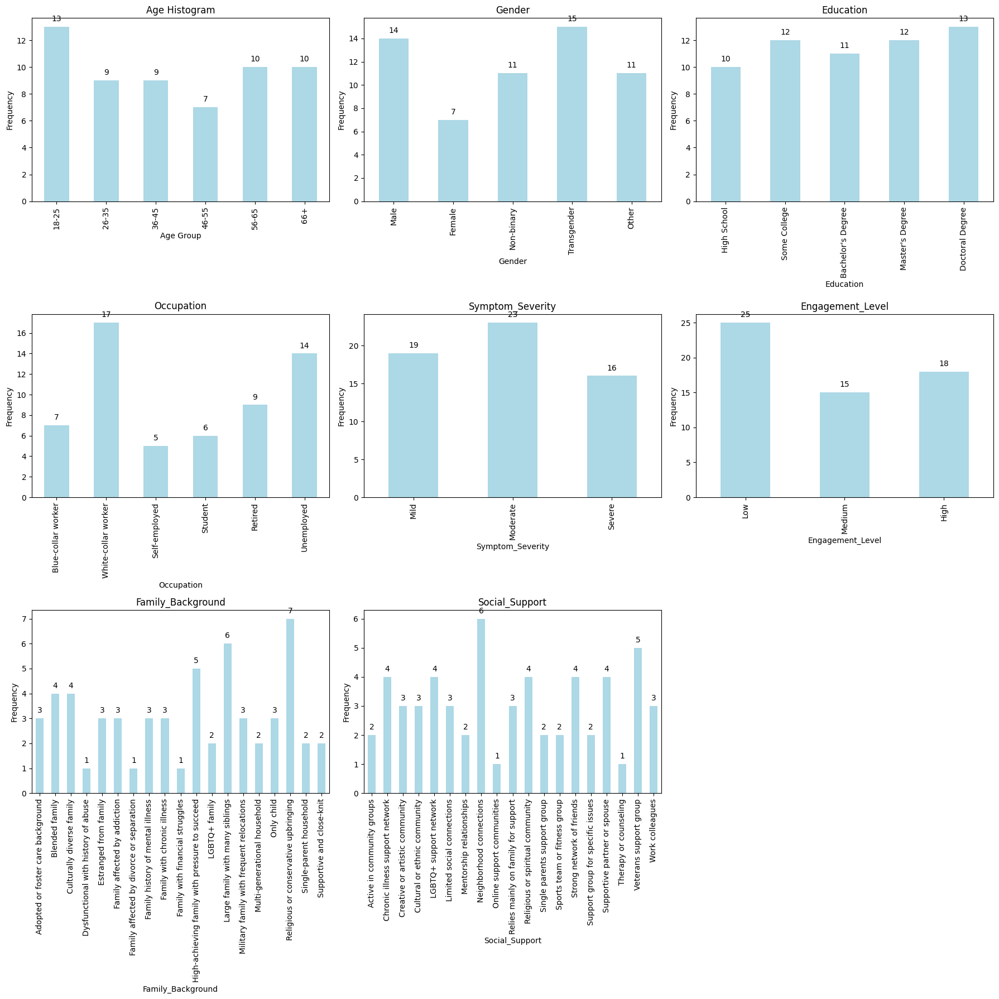

In [ ]:
# Function to add value labels on bars
def add_value_labels(ax):
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Create a 3x3 grid for the plots
fig, axes = plt.subplots(3, 3, figsize=(18, 18))

# Plot Age histogram
ax = df['Age'].value_counts().sort_index().plot(kind='bar', color='lightblue', ax=axes[0, 0])
axes[0, 0].set_title('Age Histogram')
axes[0, 0].set_xlabel('Age Group')
axes[0, 0].set_ylabel('Frequency')
add_value_labels(ax)

# Plot bar charts for categorical variables
categorical_vars = ['Gender', 'Education', 'Occupation', 'Symptom_Severity', 'Engagement_Level', 'Family_Background', 'Social_Support']
mapping_vars = ['Gender_Mapped', 'Education_Mapped', 'Occupation_Mapped', 'Symptom_Severity_Mapped', 'Engagement_Level_Mapped', 'Family_Background', 'Social_Support']

for i, var in enumerate(categorical_vars):
    row = (i + 1) // 3
    col = (i + 1) % 3
    sorted_var = df[var].value_counts().index.tolist()
    sorted_var.sort(key=lambda x: df[df[var] == x][mapping_vars[i]].iloc[0])
    ax = df[var].value_counts().reindex(sorted_var).plot(kind='bar', color='lightblue', ax=axes[row, col])
    axes[row, col].set_title(f'{var}')
    axes[row, col].set_xlabel(var)
    axes[row, col].set_ylabel('Frequency')
    add_value_labels(ax)

# Hide any unused subplots
for j in range(len(categorical_vars) + 1, 9):
    row = j // 3
    col = j % 3
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

**Age Distribution**
The age distribution of the individuals shows a diverse range. The largest group falls within the 18-25 age range, with 13 individuals. The 56-65 and 66+ age groups each have 10 individuals. The 26-35 and 36-45 age ranges both have 9 individuals, while the 46-55 age group has the fewest, with 7 individuals.

**Gender Distribution**
The gender distribution highlights a significant representation of Transgender individuals, with 15 people. Male individuals follow closely with 14, while Non-binary and Other genders each have 11 individuals. Female individuals are the least represented, with 7 people.

**Education Levels**
Education levels vary among the individuals. The most common education level is a Doctoral Degree, held by 13 individuals. Some College and Master's Degree are each held by 12 individuals. Bachelor's Degree is held by 11 individuals, and High School is the least common, with 10 individuals.

**Occupation Types**
Occupational distribution shows that the majority are White-collar workers (17 individuals). Unemployed individuals are the next largest group, with 14 people. Retired individuals number 9, followed by Blue-collar workers (7), Students (6), and Self-employed individuals (5).

**Symptom Severity**
Symptom severity among the individuals is mostly Moderate, with 23 individuals. Mild symptoms are experienced by 19 individuals, while Severe symptoms are reported by 16 individuals.

**Engagement Levels**
Engagement levels show that the majority have a Low engagement level (25 individuals). High engagement levels are seen in 18 individuals, and Medium engagement levels are reported by 15 individuals.

**Family Backgrounds**
Family backgrounds are diverse, with the most common being a Religious or conservative upbringing (7 individuals). Other notable backgrounds include Large family with many siblings (6), High-achieving family with pressure to succeed (5), and Blended family and Culturally diverse family (4 each). Several backgrounds, such as Family history of mental illness, Adopted or foster care background, and Family with chronic illness, each have 3 individuals.

**Social Support**
Social support networks vary widely. The most common support comes from Neighborhood connections (6 individuals). Veterans support group is the next most common (5), followed by Supportive partner or spouse, Chronic illness support network, Religious or spiritual community, LGBTQ+ support network, and Strong network of friends (4 each). Other notable support networks include Limited social connections, Cultural or ethnic community, and Work colleagues (3 each).



## Measures of Central Tendency and Dispersion

In [ ]:
# Calculate measures of central tendency and dispersion for each variable
def calculate_statistics(df, column):
    stats = {}
    stats['Mean'] = df[column].mean()
    stats['Median'] = df[column].median()
    stats['Mode'] = df[column].mode().values[0]
    stats['Range'] = df[column].max() - df[column].min()
    stats['Variance'] = df[column].var()
    stats['Standard Deviation'] = df[column].std()
    return stats

# List of variables to calculate statistics for
variables = ['Age_Mapped', 'Gender_Mapped', 'Ethnicity_Mapped', 'Education_Mapped', 'Occupation_Mapped', 'Symptom_Severity_Mapped', 'Engagement_Level_Mapped']

# Calculate statistics for each variable
statistics = {var: calculate_statistics(df, var) for var in variables}

# Create a DataFrame to store the statistics
stats_df = pd.DataFrame(statistics).T  # Transpose for better table format

# Display the statistics table
stats_df

,Mean,Median,Mode,Range,Variance,Standard Deviation
Age_Mapped,3.379310,3.0,1.0,5.0,3.327284,1.824084
Gender_Mapped,3.034483,3.0,4.0,4.0,2.139141,1.462580
Ethnicity_Mapped,3.387755,3.0,3.0,5.0,2.784014,1.668536
Education_Mapped,3.103448,3.0,5.0,4.0,2.024198,1.422743
Occupation_Mapped,3.603448,3.5,2.0,5.0,3.366304,1.834749
Symptom_Severity_Mapped,0.948276,1.0,1.0,2.0,0.611313,0.781865
Engagement_Level_Mapped,0.879310,1.0,0.0,2.0,0.739564,0.859979


## Shannon Diversity Index

In [ ]:
# Function to calculate Shannon Diversity Index
def shannon_diversity_index(column):
    counts = df[column].value_counts()
    proportions = counts / counts.sum()
    shannon_index = -sum(proportions * np.log2(proportions))
    return shannon_index

# List of variables to calculate Shannon Diversity Index for
variables = ['Age', 'Gender', 'Ethnicity', 'Education', 'Occupation', 'Symptom_Severity', 'Engagement_Level']

# Calculate Shannon Diversity Index for each variable
shannon_indices = {var: shannon_diversity_index(var) for var in variables}

# Display the Shannon Diversity Index for each variable
for var, index in shannon_indices.items():
    print(f"Shannon Diversity Index for {var}: {index}")

Shannon Diversity Index for Age: 2.560491120749188
Shannon Diversity Index for Gender: 2.2775446518972617
Shannon Diversity Index for Ethnicity: 2.479213487428499
Shannon Diversity Index for Education: 2.3162940105236784
Shannon Diversity Index for Occupation: 2.4426350958825718
Shannon Diversity Index for Symptom_Severity: 1.569143965045858
Shannon Diversity Index for Engagement_Level: 1.5518014484989942



The Shannon Diversity Index measures the uncertainty in predicting the category of a randomly selected individual. Higher values indicate greater diversity. Here's what the values suggest for each variable:

**Age (2.56):**
This relatively high value indicates a diverse age distribution among the individuals. There is a significant spread across different age groups, making it less predictable to guess an individual's age.

**Gender (2.28):**
This value suggests a moderate level of gender diversity. There is a good mix of different gender identities, making it somewhat unpredictable to guess an individual's gender.

**Ethnicity (2.48):**
This high value indicates a diverse ethnic composition. There is a wide range of ethnic backgrounds represented, making it less predictable to guess an individual's ethnicity.

**Education (2.32):**
This value suggests a moderate level of diversity in education levels. There is a variety of educational backgrounds, making it somewhat unpredictable to guess an individual's education level.

**Occupation (2.44):**
This high value indicates a diverse range of occupations. There is a significant spread across different types of occupations, making it less predictable to guess an individual's occupation.

**Symptom Severity (1.57):**
This lower value suggests less diversity in symptom severity. The distribution is more concentrated, making it more predictable to guess an individual's symptom severity.

**Engagement Level (1.55):**
Similar to symptom severity, this lower value indicates less diversity in engagement levels. The distribution is more concentrated, making it more predictable to guess an individual's engagement level.

**Summary**
High Diversity: Age, Ethnicity, Occupation
Moderate Diversity: Gender, Education
Low Diversity: Symptom Severity, Engagement Level

Shannon, C. E., & Weaver, W. (1949). The Mathematical Theory of Communication. Urbana: University of Illinois Press1.
Spellerberg, I. F., & Fedor, P. J. (2003). A tribute to Claude Shannon (1916–2001) and a plea for more rigorous use of species richness, species diversity and the ‘Shannon – Wiener’ Index. Global Ecology and Biogeography, 12(3), 177-1791.
Magurran, A. E. (2004). Measuring Biological Diversity. Oxford: Blackwell Publishing1.
These references provide foundational information on the Shannon Diversity Index and its applications in various fields.

If you need further details or have any other questions, feel free to ask!

1: SpringerLink - Shannon-Weaver Diversity Index
https://link.springer.com/referenceworkentry/10.1007/978-94-017-8801-4_233

## Richness and Evenness

In [ ]:
# Function to calculate Richness
def richness(column):
    return df[column].nunique()

# Function to calculate Evenness
def evenness(column):
    counts = df[column].value_counts()
    proportions = counts / counts.sum()
    shannon_index = -sum(proportions * np.log2(proportions))
    max_shannon_index = np.log2(len(proportions))
    evenness_index = shannon_index / max_shannon_index
    return evenness_index

# List of variables to calculate Richness and Evenness for
variables = ['Age', 'Gender', 'Ethnicity', 'Education', 'Occupation', 'Symptom_Severity', 'Engagement_Level']

# Calculate Richness and Evenness for each variable
richness_values = {var: richness(var) for var in variables}
evenness_values = {var: evenness(var) for var in variables}

# Display the Richness and Evenness for each variable
for var in variables:
    print(f"Richness for {var}: {richness_values[var]}")
    print(f"Evenness for {var}: {evenness_values[var]}")
    print()

Richness for Age: 6
Evenness for Age: 0.990533177960941

Richness for Gender: 5
Evenness for Gender: 0.9808850915375769

Richness for Ethnicity: 6
Evenness for Ethnicity: 0.9590906973454527

Richness for Education: 5
Evenness for Education: 0.9975735319383535

Richness for Occupation: 6
Evenness for Occupation: 0.9449402438917865

Richness for Symptom_Severity: 3
Evenness for Symptom_Severity: 0.990019615184523

Richness for Engagement_Level: 3
Evenness for Engagement_Level: 0.9790777054933012



## Interpretation of Richness and Evenness
**Richness**
Age: 6 categories
Gender: 5 categories
Ethnicity: 6 categories
Education: 5 categories
Occupation: 6 categories
Symptom Severity: 3 categories
Engagement Level: 3 categories
Richness indicates the number of different categories present in each variable. Higher richness values suggest greater diversity in the dataset.

**Evenness**
Age: 0.991
Gender: 0.981
Ethnicity: 0.959
Education: 0.998
Occupation: 0.945
Symptom Severity: 0.990
Engagement Level: 0.979
Evenness measures how evenly individuals are distributed across different categories. Higher evenness values (close to 1) indicate a more balanced representation across categories.

**Summary**
High Richness and Evenness: Age, Ethnicity, Occupation
Moderate Richness and High Evenness: Gender, Education
Lower Richness but High Evenness: Symptom Severity, Engagement Level

## Correlation Matrix

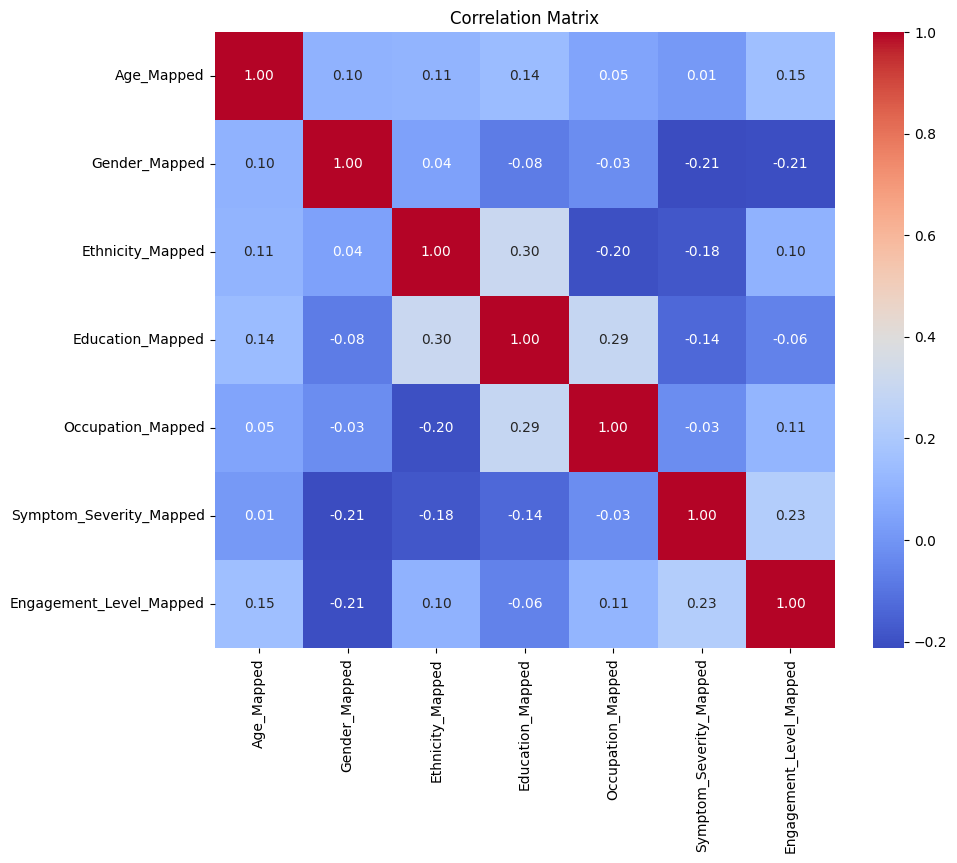

In [ ]:
# Select the relevant columns for correlation matrix
correlation_vars = ['Age_Mapped', 'Gender_Mapped', 'Ethnicity_Mapped', 'Education_Mapped', 'Occupation_Mapped', 'Symptom_Severity_Mapped', 'Engagement_Level_Mapped']

# Create a correlation matrix
correlation_matrix = df[correlation_vars].corr()

# Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

In [ ]:
correlation_matrix

,Age_Mapped,Gender_Mapped,Ethnicity_Mapped,Education_Mapped,Occupation_Mapped,Symptom_Severity_Mapped,Engagement_Level_Mapped
Age_Mapped,1.000000,0.100227,0.107032,0.140097,0.050975,0.013998,0.152718
Gender_Mapped,0.100227,1.000000,0.042090,-0.077623,-0.027504,-0.213197,-0.205856
Ethnicity_Mapped,0.107032,0.042090,1.000000,0.303823,-0.200629,-0.182994,0.102207
Education_Mapped,0.140097,-0.077623,0.303823,1.000000,0.291544,-0.137047,-0.061310
Occupation_Mapped,0.050975,-0.027504,-0.200629,0.291544,1.000000,-0.026779,0.113681
Symptom_Severity_Mapped,0.013998,-0.213197,-0.182994,-0.137047,-0.026779,1.000000,0.225380
Engagement_Level_Mapped,0.152718,-0.205856,0.102207,-0.061310,0.113681,0.225380,1.000000


**Summary of the Correlation Matrix**
The correlation matrix shows the relationships between various demographic and psychological variables. Here are the key points:

**Age:**
Weak positive correlations with Education (0.140) and Engagement Level (0.153).
Almost no correlation with Symptom Severity (0.014).

**Gender:**
Moderate negative correlations with Symptom Severity (-0.213) and Engagement Level (-0.206).
Weak negative correlation with Education (-0.078).

**Ethnicity:**
Moderate positive correlation with Education (0.304).
Weak negative correlations with Occupation (-0.201) and Symptom Severity (-0.183).

**Education:**
Moderate positive correlation with Occupation (0.292).
Weak negative correlation with Symptom Severity (-0.137).

**Occupation:**
Weak positive correlation with Engagement Level (0.114).
Almost no correlation with Symptom Severity (-0.027).
Symptom Severity:

Moderate positive correlation with Engagement Level (0.225).

**Key Takeaways**
Ethnicity and Education have the strongest positive correlation (0.304), suggesting that ethnicity might influence education levels.
Education and Occupation also show a moderate positive correlation (0.292), indicating that higher education levels might be associated with certain occupations.
Symptom Severity and Engagement Level have a moderate positive correlation (0.225), suggesting that higher symptom severity might be associated with higher engagement levels.
Gender shows moderate negative correlations with Symptom Severity (-0.213) and Engagement Level (-0.206), indicating that gender might influence these factors.

# NLP descriptive analyses

The text analyise will be in three parts to present the commonalty between overall combined dataset, single Sessions and phases.


**Tokenization**: Breaking down the text into individual words.\
**Word Frequency Analysis:** Finding the most common words.\
**Word Cloud:** Visualizing the most frequent words.\
**N-gram Analysis:** Examining bigrams (sequences of 2,3,4 words).

# Observations

## Comparison of Therapy Phases and Sessions common words


**Common Words:** Across all phases and the combined text, words like patient, therapist, thoughts, im, thought, like, and session appear frequently.

**Phase-Specific Words**: Certain words are more prominent in specific phases. For example, work and depression are notable in the ASSESSMENT phase, beliefs and evidence in the MIDDLE phase, progress and support in the TERMINATION phase, and techniques and practice in the INITIAL phase.

**Phase-by-Phase Common Words**

**1. ASSESSMENT (Sessions 1-3)**

**Common Words:** patient, therapist, thought, im, thoughts, like, work, depression, negative, session

**Focus:** Initial evaluation, understanding the patient's condition, and identifying key issues like depression and negative thoughts.\
**Mutual Words:** patient, therapist, thought, im, thoughts, like, negative, session\
**Not Mutual Words:** work, depression

**2. INITIAL (Sessions 4-7)**
**Common Words**: patient, thought, therapist, thoughts, im, like, session, techniques, feel, practice\
**Focus:** Introducing techniques and practices, starting to address thoughts and feelings, and building a therapeutic relationship.\
**Mutual Words:**patient, thought, therapist, thoughts, im, like, session\
**Not Mutual Words:** techniques, feel, practice\

**3. MIDDLE (Sessions 8-17)**
**Common Words**: patient, therapist, thoughts, im, thought, like, beliefs, negative, session, evidence\
**Focus: ** Deepening the work on thoughts and beliefs, addressing negative patterns, and providing evidence-based interventions.\
**Mutual Words:**patient, therapist, thoughts, im, thought, like, negative, session\
**Not Mutual Words:** beliefs, evidence

**4. TERMINATION (Sessions 18-20)**
**Common Words**: patient, therapist, im, thoughts, progress, like, thought, session, support, negative\
**Focus:** Reviewing progress, providing support for the future, and preparing for the end of therapy.\
**Mutual Words:** patient, therapist, im, thoughts, like, thought, session, negative\
**Not Mutual Words:** progress, support

**Summary**
Mutual Words Across All Phases: patient, therapist, im, thoughts, like, thought, session, negative\
**Phase-Specific Words:**\
ASSESSMENT: work, depression\
INITIAL: techniques, feel, practice\
MIDDLE: beliefs, evidence\
TERMINATION: progress, support


## Comparison of Therapy Phases and Sessions n-grams (n=2,3)
**Phase: ASSESSMENT (Sessions 1-3)**\
**Focus:** Establishing rapport, identifying goals, introducing CBT basics, and assessing thought/behavior patterns.\
**Key Terms:**\
**Common/Mutual:** "challenging negative thoughts," "therapist thats great," "next session review," "plan next session."\
**Unique:** "important personal details," "cognitive behavioral therapy (CBT)," "connection thoughts feelings," "specific measurable goals."\
**Session Highlights:**
Early sessions emphasize psychoeducation (e.g., "cognitive distortions," "thoughts feelings behaviors") and foundational tools like "thought records."

**Phase: INITIAL (Sessions 4-7)**\
**Focus:** Skill-building for distress management (e.g., relaxation, behavioral activation).\
**Key Terms:**\
**Common/Mutual:** "thought records," "challenging negative thoughts," "therapist thats great."\
**Unique:** "distress tolerance techniques," "deep breathing," "progressive muscle relaxation," "behavioral activation."\
**Session Highlights:** Techniques like "distress tolerance" and "muscle relaxation" dominate. Behavioral activation is introduced to counter inactivity.

**Phase: MIDDLE (Sessions 8-17)**
Focus: Addressing core beliefs, refining thought restructuring, and using advanced CBT tools.\
**Key Terms:**\
**Common/Mutual:** "core beliefs," "positive data log," "challenging negative thoughts."\
**Unique:** "downward arrow technique," "im good enough," "beliefs intermediate beliefs."\
**Session Highlights:** Deep exploration of core beliefs (e.g., "core beliefs intermediate") and systematic tracking via "positive data log."

**Phase: TERMINATION (Sessions 18-20)**
**Focus:** Relapse prevention, consolidating skills, and preparing for post-therapy independence.\
**Key Terms:**\
**Common/Mutual:** "thought records," "core beliefs," "therapist thats great."\
**Unique:** "relapse prevention plan," "coping cards," "wellness action plan," "early warning signs."\
**Session Highlights:**\
Emphasis on long-term strategies (e.g., "coping cards" for triggers, "wellness action plan").



## Analyzing all the combined text

In [ ]:
import json
import re
import nltk
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud

# Download required NLTK resources only once
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

Most common words: [('patient', 35313), ('therapist', 32903), ('thoughts', 30121), ('im', 29980), ('thought', 29727), ('like', 22041), ('session', 19052), ('negative', 18259), ('progress', 15897), ('beliefs', 15273)]

Top 10 2-grams:
thought records: 11946
negative thoughts: 11594
therapist thats: 9348
core beliefs: 5386
thats great: 5036
behavioral activation: 4852
positive data: 4798
data log: 4782
last session: 4699
next session: 4674

Top 10 3-grams:
therapist thats great: 4861
positive data log: 4782
challenging negative thoughts: 3346
since last session: 2456
plan next session: 2267
next session review: 2219
im good enough: 2151
techniques exercises used: 2096
patients progress challenges: 2065
main topics discussed: 2039

Top 10 4-grams:
plan next session review: 2059
core beliefs intermediate beliefs: 1808
patients progress challenges depression: 1792
progress challenges depression symptoms: 1792
symptoms important personal details: 1762
depression symptoms important personal: 

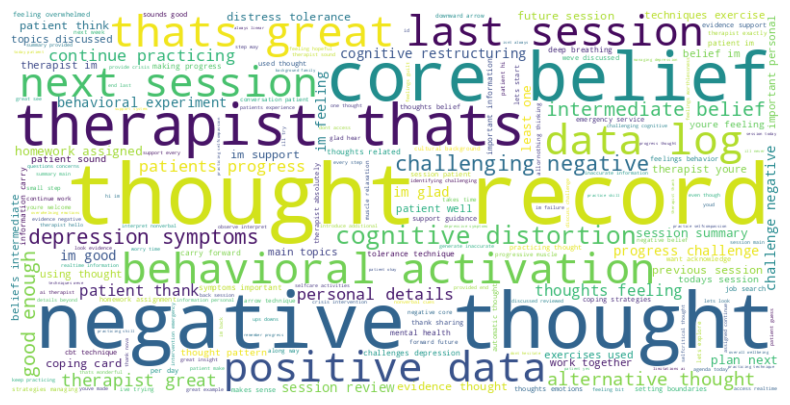

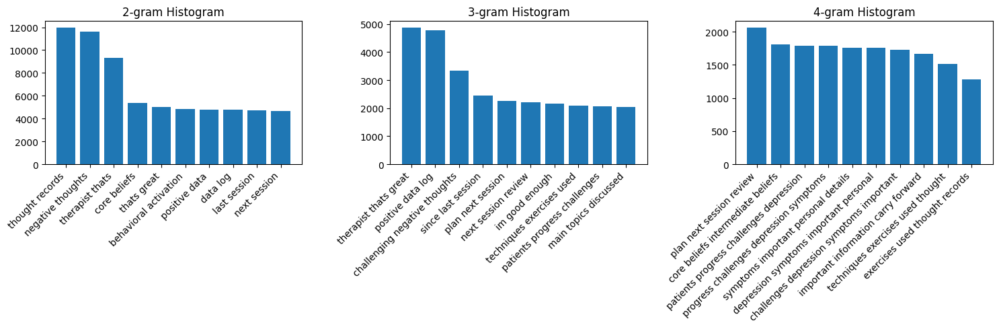

In [ ]:
with open('Combined_Synthetic_Transcripts_Nov_2.txt', 'r') as file:
    text = file.read()

# Preprocessing: Remove signs and stop words
text = re.sub(r'[^\w\s]', '', text)  # Remove signs
tokens = word_tokenize(text.lower())  # Tokenize and convert to lowercase
tokens = [word for word in tokens if word not in stopwords.words('english')]  # Remove stop words

# Word Frequency Analysis
fdist = FreqDist(tokens)
common_words = fdist.most_common(10)
print("Most common words:", common_words)

# N-gram Analysis with Text Output (n=2, 3, 4)
for n in range(2, 5):  # For n = 2, 3, 4
    vectorizer = CountVectorizer(ngram_range=(n, n))
    X = vectorizer.fit_transform([' '.join(tokens)])
    ngram_freq = X.toarray().sum(axis=0)
    ngram_freq_dict = {ngram: freq for ngram, freq in zip(vectorizer.get_feature_names_out(), ngram_freq)}

    # Sort n-grams by frequency
    sorted_ngrams = sorted(ngram_freq_dict.items(), key=lambda item: item[1], reverse=True)[:10]  # Get top 10

    # Print n-gram frequencies
    print(f"\nTop 10 {n}-grams:")
    for ngram, freq in sorted_ngrams:
        print(f"{ngram}: {freq}")

# Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(tokens))  # Generate from tokens
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Create subplots for histograms
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# N-gram Analysis with Histograms (n=2, 3, 4)
for i, n in enumerate([2, 3, 4]):
    vectorizer = CountVectorizer(ngram_range=(n, n))
    X = vectorizer.fit_transform([' '.join(tokens)])  # Fit to tokens
    ngram_freq = X.toarray().sum(axis=0)
    ngram_freq_dict = {ngram: freq for ngram, freq in zip(vectorizer.get_feature_names_out(), ngram_freq)}

    # Sort n-grams by frequency
    sorted_ngrams = sorted(ngram_freq_dict.items(), key=lambda item: item[1], reverse=True)[:10]  # Get top 10

    # Create histogram in the corresponding subplot
    axes[i].bar(*zip(*sorted_ngrams))
    axes[i].set_xticks(range(len(sorted_ngrams)))  # Set x-axis ticks
    axes[i].set_xticklabels([ngram[0] for ngram in sorted_ngrams], rotation=45, ha='right')  # Set x-axis labels
    axes[i].set_title(f"{n}-gram Histogram")

plt.tight_layout()  # Adjust layout for better readability
plt.show()


## Sessions analysis

In [ ]:
def group_sessions(input_file, output_file):
    """Group sessions by session number and combine their texts."""
    with open(input_file, 'r') as f:
        sessions = json.load(f)

    grouped_sessions = {}

    for session in sessions:
        session_number = session['session_number'] if session['session_number'] != "unknown" else "1"
        session_text = session['session_text']

        if session_number not in grouped_sessions:
            grouped_sessions[session_number] = {
                "session_group": session_number,
                "combined_text": ""
            }

        grouped_sessions[session_number]["combined_text"] += session_text + "\n"

    # Prepare the final output format
    final_output = [{"session_group": group["session_group"], "combined_text": group["combined_text"].strip()} for group in grouped_sessions.values()]

    with open(output_file, 'w') as f:
        json.dump(final_output, f, indent=4)

    print(f"Successfully grouped sessions and saved to {output_file}")

if __name__ == "__main__":
    input_file = 'Combined_Synthetic_Transcripts_Nov_2.json'
    output_file = 'Grouped_Sessions.json'
    group_sessions(input_file, output_file)


Successfully grouped sessions and saved to Grouped_Sessions.json


Session 1:
Number of words: 76126
Most frequent words: [('im', 1382), ('therapist', 1220), ('depression', 1152), ('patient', 1134), ('like', 1079), ('work', 842), ('therapy', 760), ('help', 760), ('well', 736), ('support', 680)]

Top 10 2-grams:
work together: 298
next session: 282
thought record: 248
feel like: 218
id like: 211
negative thoughts: 207
mental health: 205
thought patterns: 201
coping strategies: 169
sounds like: 165

Top 10 3-grams:
negative thought patterns: 142
therapist sounds like: 103
keep thought record: 93
cognitive behavioral therapy: 85
behavioral therapy cbt: 82
work together well: 81
feel like im: 77
well work together: 77
continue work together: 72
therapist thats great: 71

Top 10 4-grams:
cognitive behavioral therapy cbt: 82
im first therapy session: 53
continue work together well: 49
personal details beyond share: 47
access realtime information personal: 46
crisis intervention emergency services: 46
information personal details beyond: 46
provide crisis in

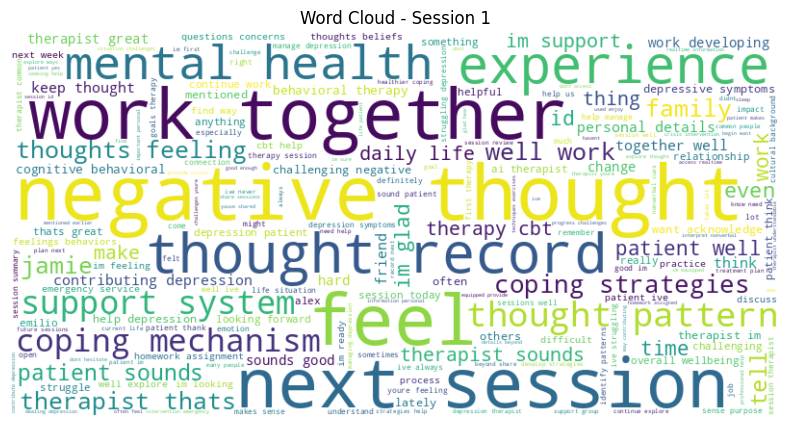

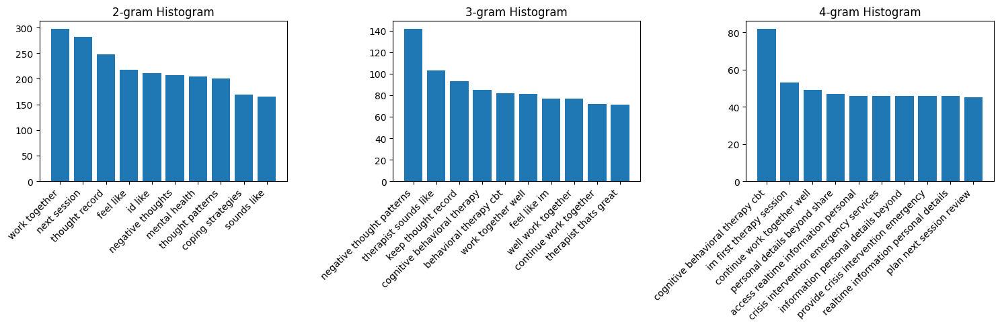

Session 10:
Number of words: 111720
Most frequent words: [('patient', 1852), ('therapist', 1672), ('thoughts', 1645), ('thought', 1581), ('im', 1477), ('negative', 1107), ('like', 1066), ('beliefs', 977), ('session', 965), ('evidence', 841)]

Top 10 2-grams:
negative thoughts: 703
thought records: 625
therapist thats: 487
core belief: 411
data log: 400
positive data: 400
core beliefs: 374
last session: 252
thats great: 248
challenging negative: 245

Top 10 3-grams:
positive data log: 400
therapist thats great: 243
challenging negative thoughts: 193
im good enough: 147
since last session: 144
beliefs intermediate beliefs: 120
next session review: 119
core beliefs intermediate: 118
plan next session: 118
challenge negative thoughts: 112

Top 10 4-grams:
core beliefs intermediate beliefs: 118
plan next session review: 111
patients progress challenges depression: 96
progress challenges depression symptoms: 96
depression symptoms important personal: 94
symptoms important personal details: 9

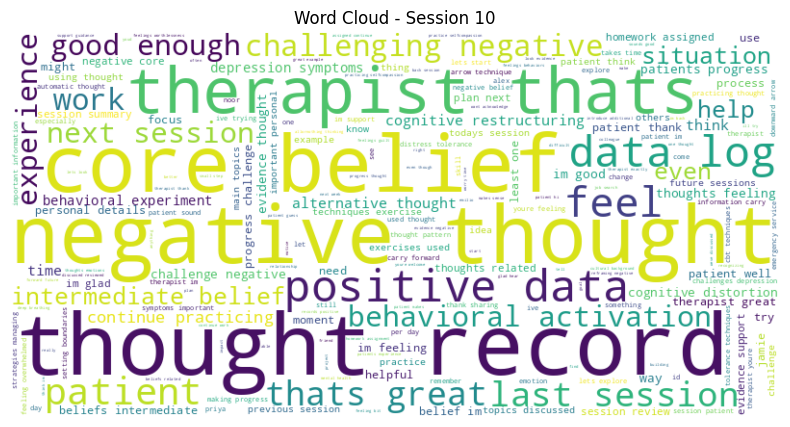

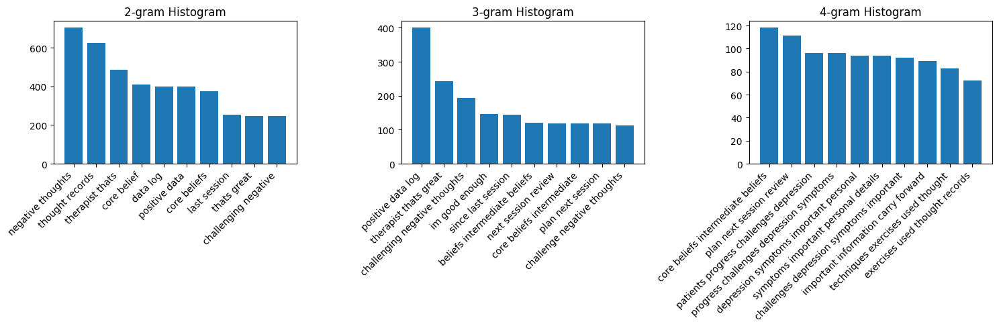

Session 11:
Number of words: 116002
Most frequent words: [('patient', 1926), ('therapist', 1771), ('thoughts', 1636), ('im', 1612), ('thought', 1539), ('like', 1140), ('negative', 1114), ('beliefs', 1054), ('session', 1006), ('evidence', 832)]

Top 10 2-grams:
negative thoughts: 718
thought records: 664
therapist thats: 478
core belief: 396
core beliefs: 378
positive data: 335
data log: 333
last session: 283
challenging negative: 263
thats great: 255

Top 10 3-grams:
positive data log: 333
therapist thats great: 247
challenging negative thoughts: 209
since last session: 154
im good enough: 135
beliefs intermediate beliefs: 122
core beliefs intermediate: 120
challenge negative thoughts: 115
plan next session: 115
next session review: 114

Top 10 4-grams:
core beliefs intermediate beliefs: 120
plan next session review: 110
patients progress challenges depression: 95
progress challenges depression symptoms: 95
depression symptoms important personal: 93
symptoms important personal details:

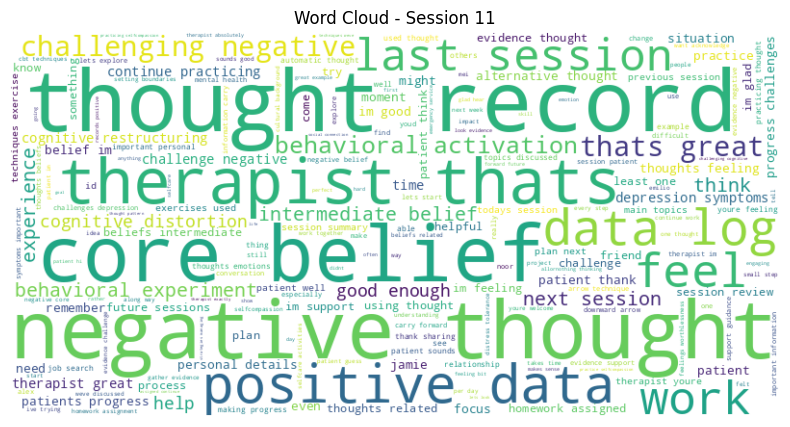

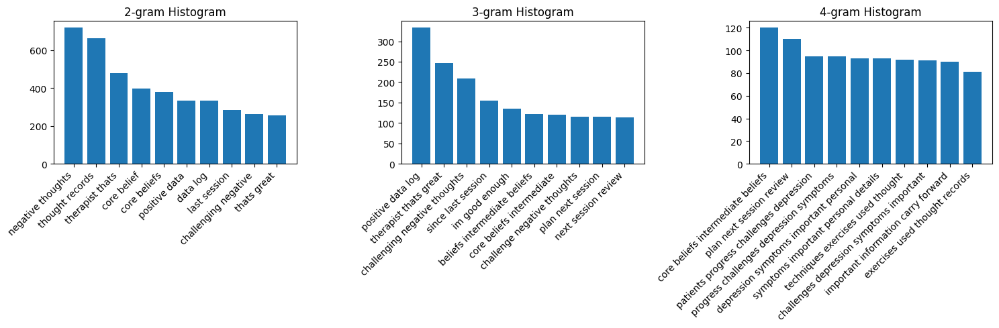

Session 12:
Number of words: 118148
Most frequent words: [('patient', 1905), ('thoughts', 1797), ('therapist', 1745), ('thought', 1672), ('im', 1613), ('beliefs', 1192), ('negative', 1187), ('like', 1160), ('session', 1035), ('evidence', 928)]

Top 10 2-grams:
negative thoughts: 738
thought records: 718
therapist thats: 565
core belief: 401
positive data: 401
data log: 399
core beliefs: 377
thats great: 312
last session: 281
behavioral activation: 251

Top 10 3-grams:
positive data log: 399
therapist thats great: 303
challenging negative thoughts: 170
since last session: 155
im good enough: 140
negative thoughts related: 132
beliefs intermediate beliefs: 124
core beliefs intermediate: 122
next session review: 119
challenge negative thoughts: 116

Top 10 4-grams:
core beliefs intermediate beliefs: 122
plan next session review: 108
patients progress challenges depression: 95
progress challenges depression symptoms: 95
techniques exercises used thought: 95
depression symptoms important pe

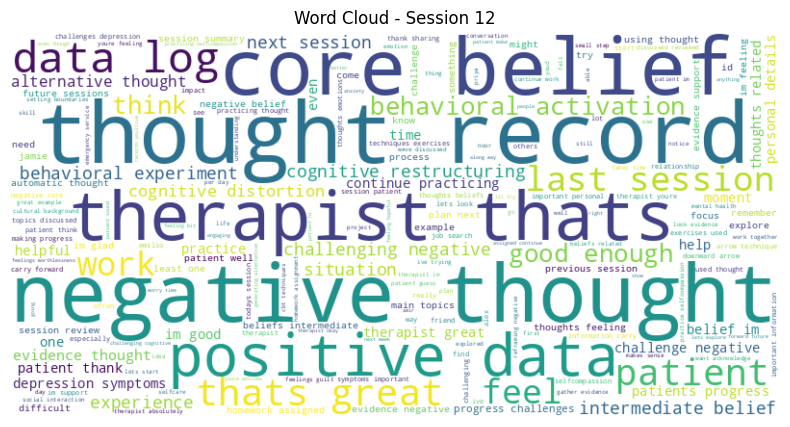

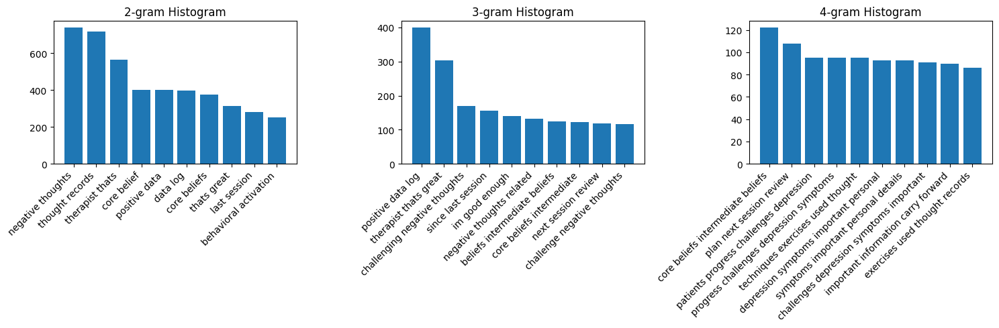

Session 13:
Number of words: 119416
Most frequent words: [('patient', 1971), ('thoughts', 1867), ('therapist', 1800), ('im', 1719), ('thought', 1611), ('beliefs', 1228), ('like', 1224), ('negative', 1145), ('session', 1007), ('evidence', 950)]

Top 10 2-grams:
negative thoughts: 733
thought records: 732
therapist thats: 516
positive data: 446
data log: 442
core beliefs: 413
core belief: 380
thats great: 289
last session: 265
good enough: 242

Top 10 3-grams:
positive data log: 442
therapist thats great: 282
im good enough: 172
challenging negative thoughts: 165
core belief im: 140
since last session: 137
beliefs intermediate beliefs: 125
core beliefs intermediate: 123
plan next session: 118
challenge negative thoughts: 116

Top 10 4-grams:
core beliefs intermediate beliefs: 123
plan next session review: 108
patients progress challenges depression: 96
progress challenges depression symptoms: 96
depression symptoms important personal: 94
symptoms important personal details: 94
challenges

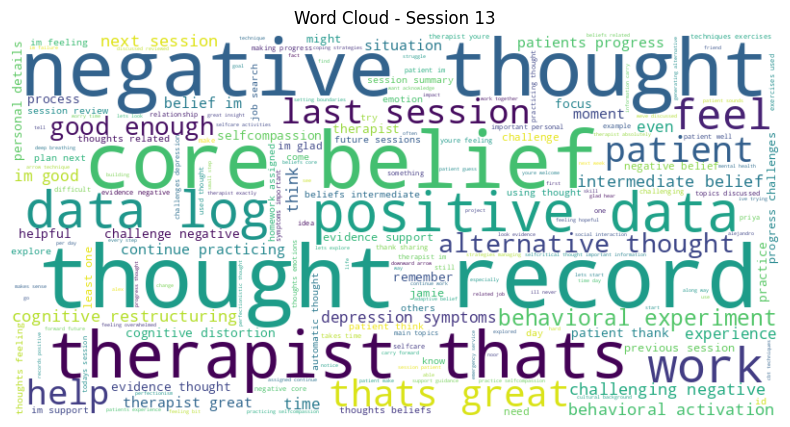

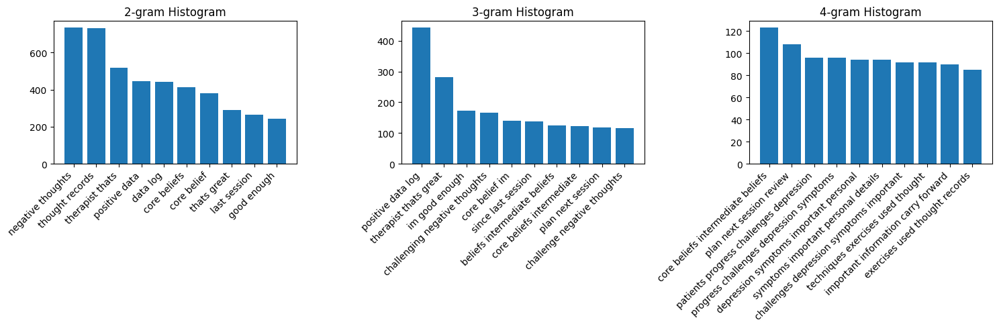

Session 14:
Number of words: 112869
Most frequent words: [('patient', 1847), ('therapist', 1687), ('im', 1680), ('thoughts', 1616), ('thought', 1577), ('beliefs', 1130), ('like', 1015), ('session', 1010), ('negative', 1008), ('evidence', 873)]

Top 10 2-grams:
thought records: 714
negative thoughts: 607
therapist thats: 526
positive data: 446
data log: 441
core beliefs: 422
core belief: 339
last session: 278
thats great: 277
next session: 247

Top 10 3-grams:
positive data log: 441
therapist thats great: 272
im good enough: 165
since last session: 148
challenging negative thoughts: 144
beliefs intermediate beliefs: 123
core beliefs intermediate: 121
downward arrow technique: 118
next session review: 118
core belief im: 117

Top 10 4-grams:
core beliefs intermediate beliefs: 121
plan next session review: 108
patients progress challenges depression: 96
progress challenges depression symptoms: 96
depression symptoms important personal: 94
symptoms important personal details: 94
challenges

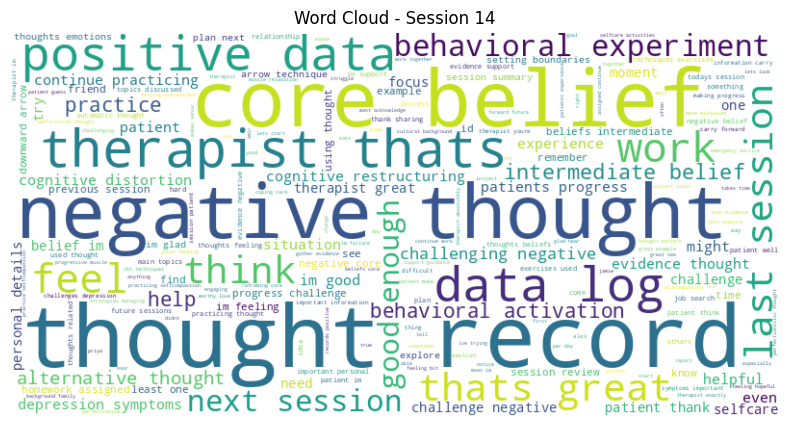

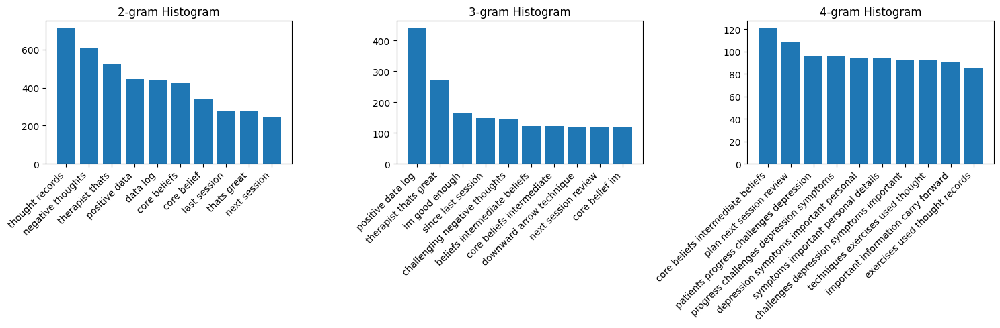

Session 15:
Number of words: 116508
Most frequent words: [('patient', 1934), ('therapist', 1737), ('im', 1671), ('thoughts', 1667), ('thought', 1513), ('beliefs', 1207), ('like', 1152), ('negative', 1084), ('session', 1042), ('core', 842)]

Top 10 2-grams:
thought records: 709
negative thoughts: 655
therapist thats: 524
core beliefs: 463
positive data: 399
data log: 398
core belief: 377
thats great: 275
challenging negative: 269
last session: 269

Top 10 3-grams:
positive data log: 398
therapist thats great: 267
challenging negative thoughts: 195
since last session: 156
downward arrow technique: 137
im good enough: 132
beliefs intermediate beliefs: 123
core belief im: 123
core beliefs intermediate: 122
plan next session: 118

Top 10 4-grams:
core beliefs intermediate beliefs: 122
plan next session review: 107
techniques exercises used thought: 98
patients progress challenges depression: 95
progress challenges depression symptoms: 95
depression symptoms important personal: 93
symptoms i

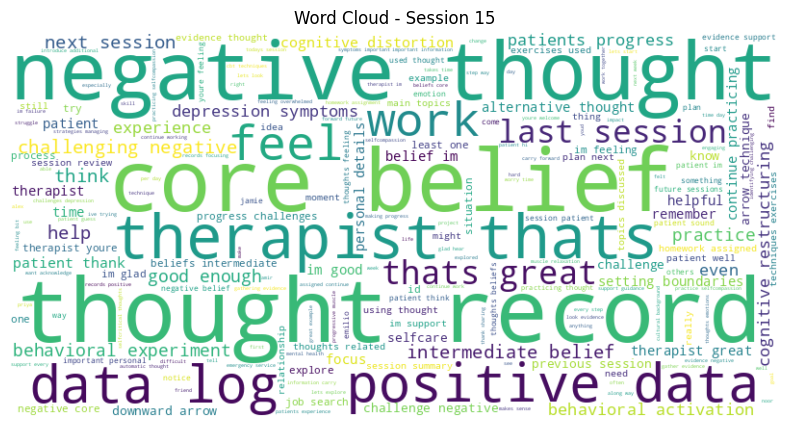

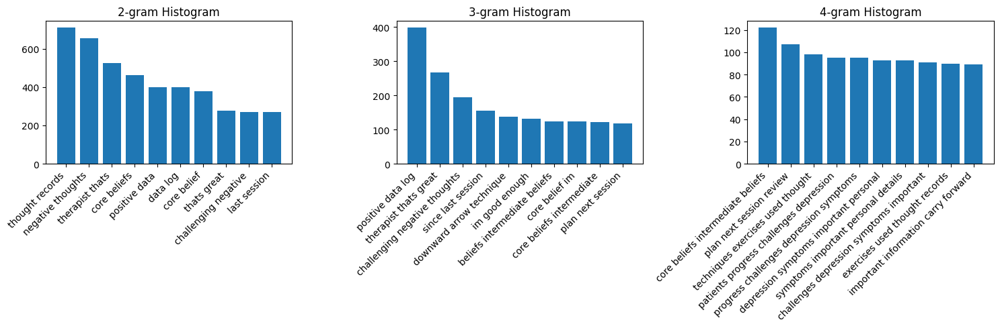

Session 16:
Number of words: 115074
Most frequent words: [('patient', 1897), ('therapist', 1746), ('im', 1730), ('thoughts', 1627), ('thought', 1555), ('beliefs', 1189), ('like', 1157), ('negative', 1026), ('session', 1005), ('core', 855)]

Top 10 2-grams:
thought records: 695
negative thoughts: 617
therapist thats: 537
data log: 477
positive data: 477
core beliefs: 434
core belief: 419
thats great: 295
good enough: 282
last session: 277

Top 10 3-grams:
positive data log: 477
therapist thats great: 284
challenging negative thoughts: 205
im good enough: 178
downward arrow technique: 175
since last session: 153
core belief im: 148
beliefs intermediate beliefs: 120
core beliefs intermediate: 120
plan next session: 116

Top 10 4-grams:
core beliefs intermediate beliefs: 120
plan next session review: 105
techniques exercises used thought: 98
belief im good enough: 95
patients progress challenges depression: 95
progress challenges depression symptoms: 95
depression symptoms important person

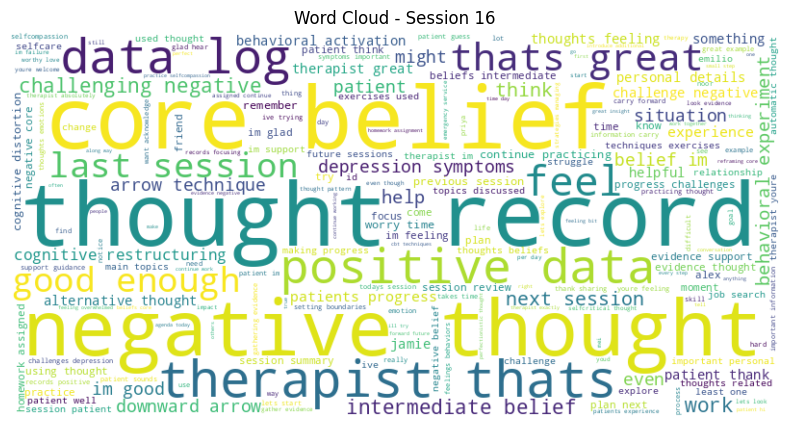

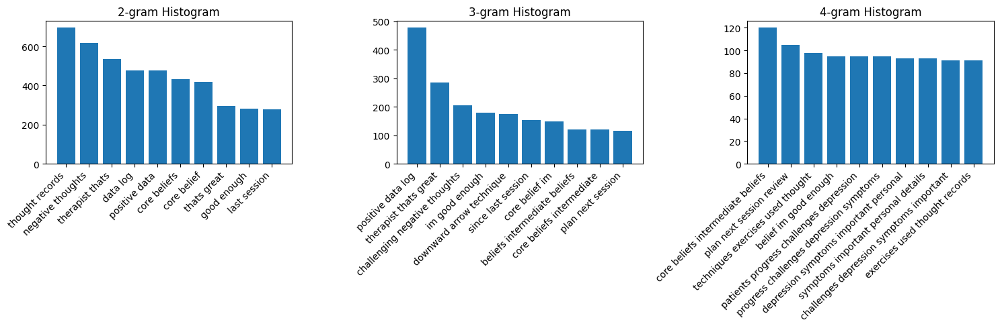

Session 17:
Number of words: 113821
Most frequent words: [('patient', 1723), ('thoughts', 1713), ('im', 1664), ('thought', 1603), ('therapist', 1603), ('beliefs', 1187), ('like', 1139), ('negative', 1115), ('session', 1023), ('core', 871)]

Top 10 2-grams:
thought records: 711
negative thoughts: 676
data log: 507
positive data: 507
therapist thats: 480
core belief: 436
core beliefs: 426
good enough: 319
last session: 287
challenging negative: 278

Top 10 3-grams:
positive data log: 507
therapist thats great: 258
challenging negative thoughts: 207
im good enough: 183
since last session: 156
downward arrow technique: 152
core belief im: 143
beliefs intermediate beliefs: 120
core beliefs intermediate: 120
challenge negative thoughts: 118

Top 10 4-grams:
core beliefs intermediate beliefs: 120
plan next session review: 104
techniques exercises used thought: 97
patients progress challenges depression: 96
progress challenges depression symptoms: 96
depression symptoms important personal: 94


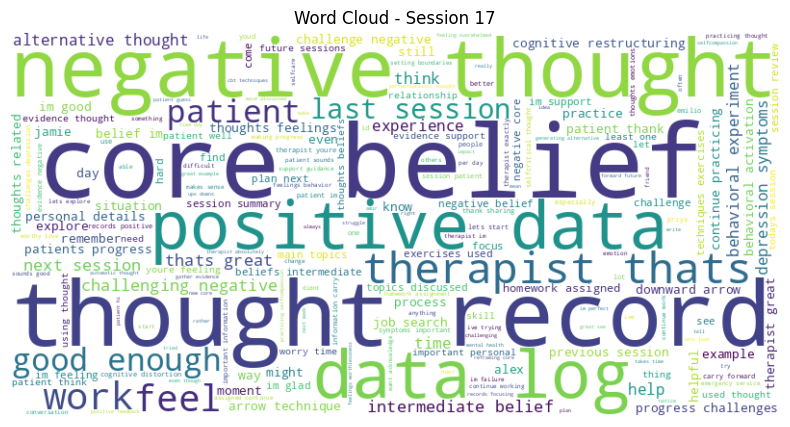

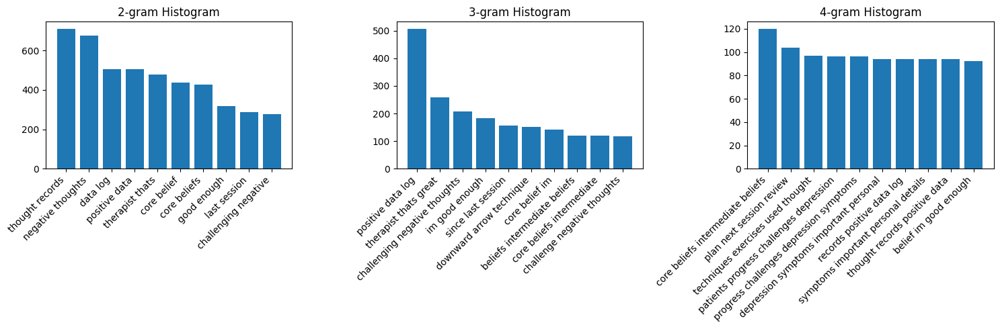

Session 18:
Number of words: 121100
Most frequent words: [('patient', 1876), ('therapist', 1789), ('im', 1689), ('thoughts', 1655), ('thought', 1348), ('like', 1274), ('progress', 1239), ('session', 1028), ('beliefs', 1023), ('negative', 973)]

Top 10 2-grams:
thought records: 669
negative thoughts: 614
therapist thats: 490
data log: 438
positive data: 438
core beliefs: 391
core belief: 366
coping cards: 285
last session: 274
challenging negative: 258

Top 10 3-grams:
positive data log: 438
therapist thats great: 230
challenging negative thoughts: 206
since last session: 152
core belief im: 128
im good enough: 122
beliefs intermediate beliefs: 121
core beliefs intermediate: 121
plan next session: 118
patients progress challenges: 117

Top 10 4-grams:
core beliefs intermediate beliefs: 121
plan next session review: 101
patients progress challenges depression: 96
progress challenges depression symptoms: 96
depression symptoms important personal: 94
symptoms important personal details: 94

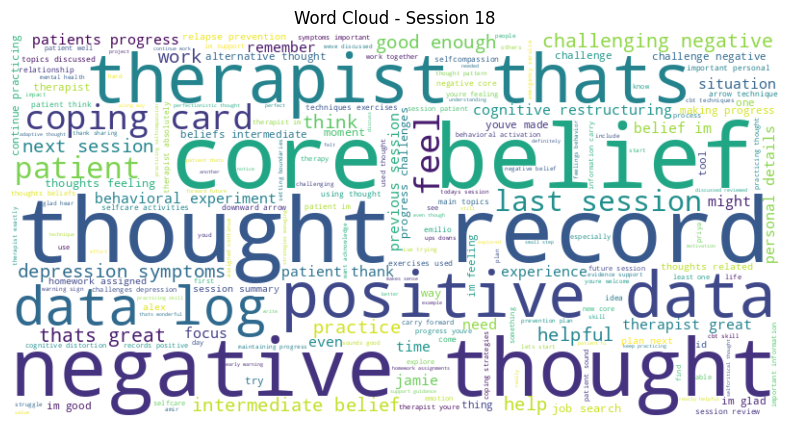

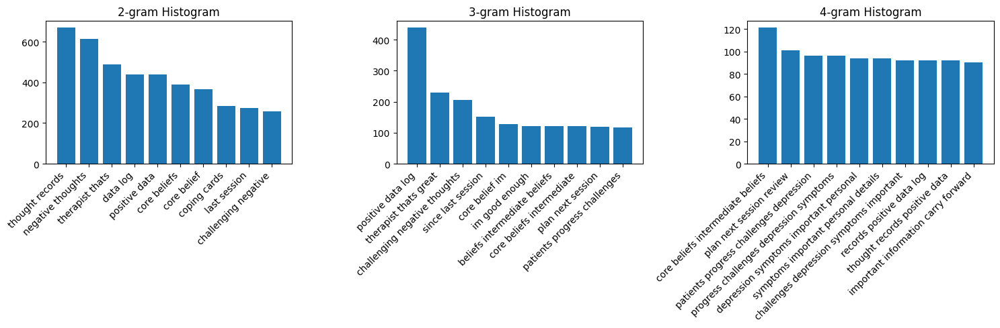

Session 19:
Number of words: 120731
Most frequent words: [('patient', 1872), ('therapist', 1784), ('thoughts', 1637), ('im', 1584), ('progress', 1328), ('like', 1210), ('thought', 1160), ('session', 1052), ('support', 961), ('coping', 909)]

Top 10 2-grams:
thought records: 595
negative thoughts: 590
therapist thats: 512
coping cards: 497
core beliefs: 317
data log: 302
positive data: 302
core belief: 294
relapse prevention: 284
last session: 270

Top 10 3-grams:
positive data log: 302
therapist thats great: 228
relapse prevention plan: 199
challenging negative thoughts: 192
since last session: 145
wellness action plan: 139
early warning signs: 135
beliefs intermediate beliefs: 124
core beliefs intermediate: 124
plan next session: 122

Top 10 4-grams:
core beliefs intermediate beliefs: 124
patients progress challenges depression: 96
progress challenges depression symptoms: 96
depression symptoms important personal: 94
plan next session review: 94
symptoms important personal details: 94

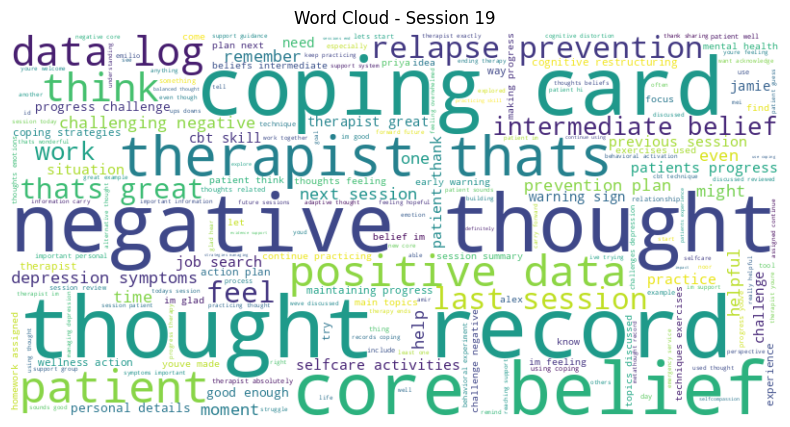

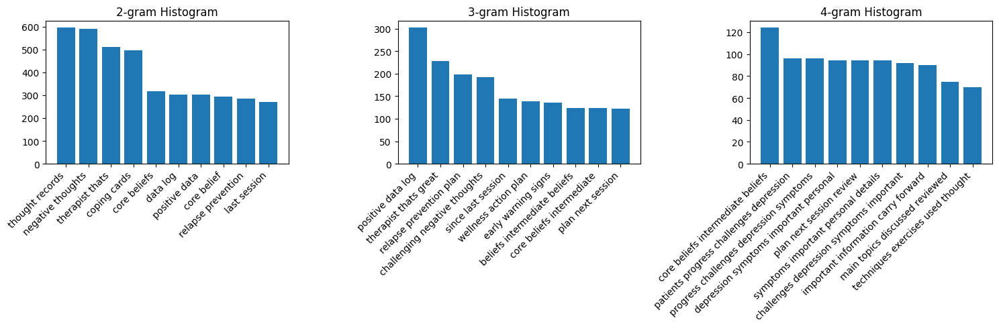

Session 2:
Number of words: 77735
Most frequent words: [('thought', 1467), ('thoughts', 1461), ('patient', 1244), ('im', 1232), ('therapist', 1208), ('homework', 960), ('negative', 906), ('session', 760), ('like', 742), ('work', 657)]

Top 10 2-grams:
cognitive distortions: 485
negative thoughts: 466
thought record: 456
thought patterns: 363
therapist thats: 344
thoughts feelings: 280
next session: 260
thats great: 249
feelings behaviors: 248
negative thought: 238

Top 10 3-grams:
therapist thats great: 231
thoughts feelings behaviors: 210
negative thought patterns: 171
challenging negative thoughts: 120
connection thoughts feelings: 116
next session review: 115
plan next session: 106
im good enough: 91
important personal details: 91
keep thought record: 89

Top 10 4-grams:
connection thoughts feelings behaviors: 115
plan next session review: 99
symptoms important personal details: 78
challenges depression symptoms important: 77
depression symptoms important personal: 77
patients progr

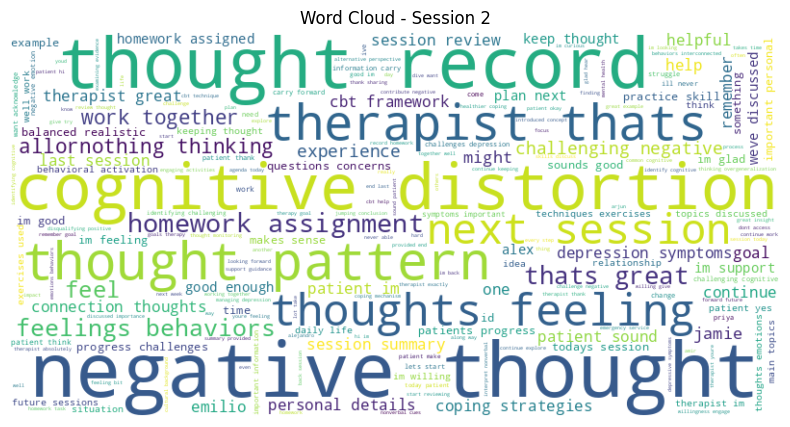

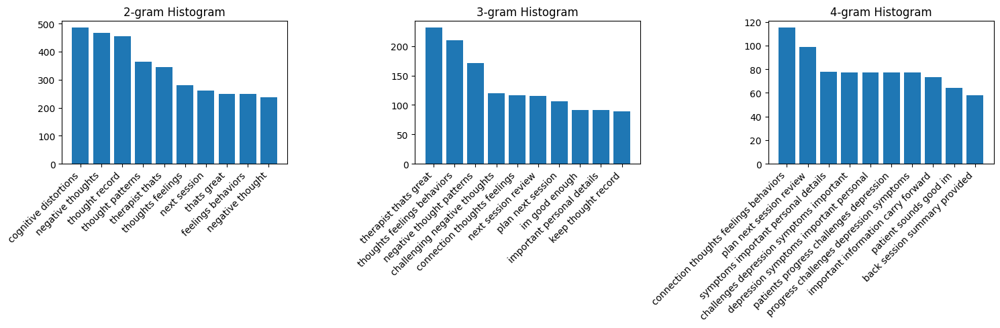

Session 20:
Number of words: 117577
Most frequent words: [('patient', 1889), ('therapist', 1774), ('im', 1527), ('progress', 1475), ('thoughts', 1343), ('support', 1162), ('like', 1102), ('thought', 1046), ('plan', 1044), ('session', 961)]

Top 10 2-grams:
thought records: 554
coping cards: 534
negative thoughts: 521
therapist thats: 483
relapse prevention: 380
core beliefs: 275
prevention plan: 275
core belief: 262
cbt skills: 261
action plan: 225

Top 10 3-grams:
relapse prevention plan: 275
positive data log: 224
wellness action plan: 223
therapist thats great: 212
challenging negative thoughts: 168
early warning signs: 153
plan next session: 130
since last session: 124
beliefs intermediate beliefs: 123
core beliefs intermediate: 123

Top 10 4-grams:
core beliefs intermediate beliefs: 123
patients progress challenges depression: 96
progress challenges depression symptoms: 96
depression symptoms important personal: 93
symptoms important personal details: 93
challenges depression symp

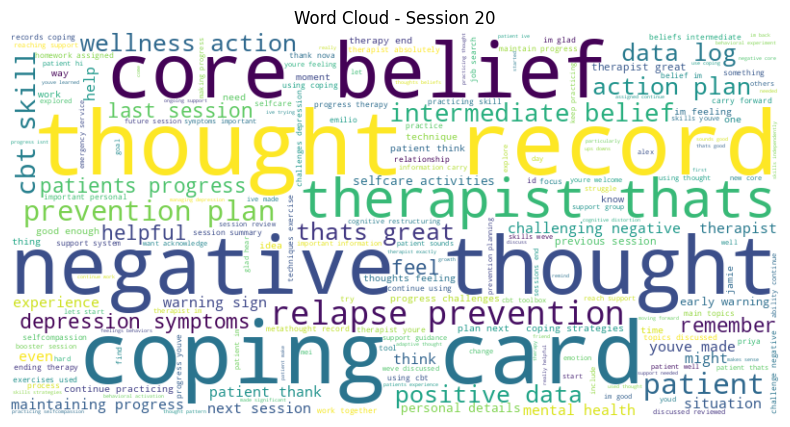

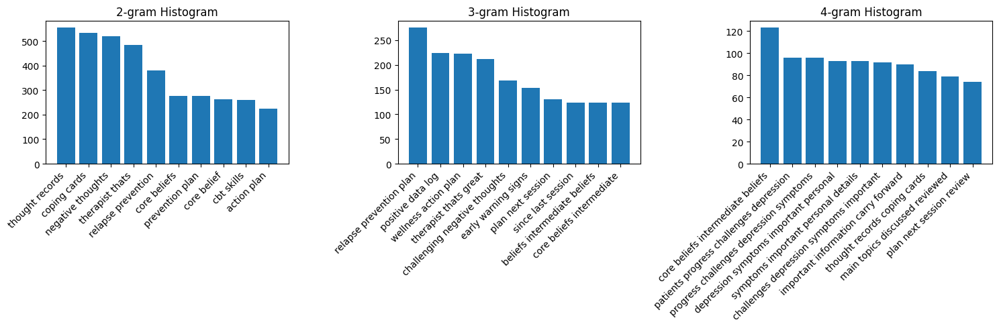

Session 3:
Number of words: 89446
Most frequent words: [('thought', 1736), ('patient', 1471), ('therapist', 1401), ('im', 1191), ('thoughts', 1124), ('goals', 912), ('like', 875), ('session', 846), ('negative', 833), ('work', 818)]

Top 10 2-grams:
negative thoughts: 506
cognitive distortions: 453
therapist thats: 418
thought records: 313
thought record: 296
next session: 281
behavioral activation: 262
thought recording: 251
thats great: 232
id like: 222

Top 10 3-grams:
therapist thats great: 225
challenging negative thoughts: 152
next session review: 132
specific measurable goals: 132
therapist im glad: 129
challenging cognitive distortions: 115
plan next session: 111
measurable goals therapy: 100
important personal details: 99
patient sounds good: 92

Top 10 4-grams:
plan next session review: 111
specific measurable goals therapy: 100
setting specific measurable goals: 85
symptoms important personal details: 80
depression symptoms important personal: 79
challenges depression symptom

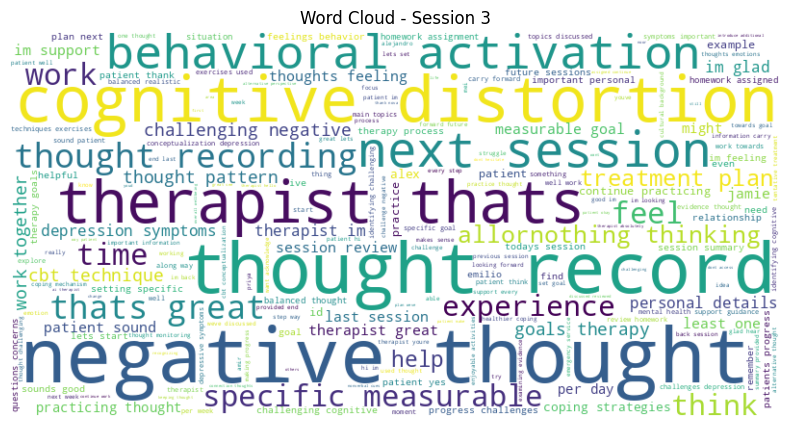

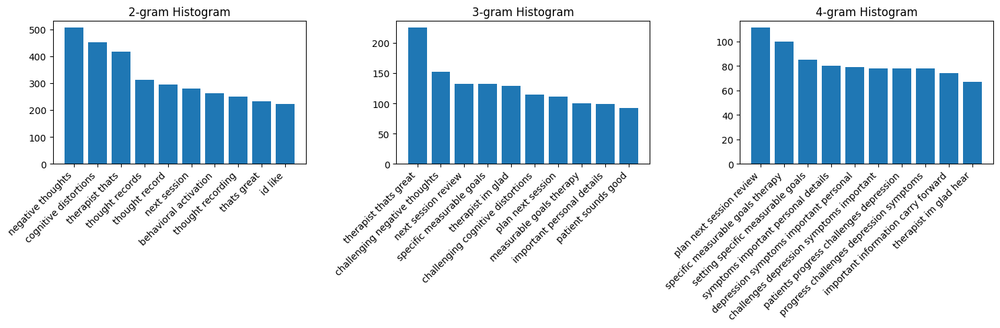

Session 4:
Number of words: 104626
Most frequent words: [('patient', 1733), ('thought', 1599), ('therapist', 1595), ('im', 1226), ('thoughts', 1132), ('like', 1059), ('session', 943), ('feel', 791), ('techniques', 770), ('activities', 770)]

Top 10 2-grams:
thought records: 535
behavioral activation: 514
therapist thats: 458
negative thoughts: 418
cognitive distortions: 276
next session: 266
thats great: 254
distress tolerance: 236
last session: 223
thought record: 194

Top 10 3-grams:
therapist thats great: 245
distress tolerance techniques: 158
challenging negative thoughts: 131
next session review: 128
since last session: 122
plan next session: 114
important personal details: 103
continue practicing thought: 99
techniques exercises used: 93
patients progress challenges: 92

Top 10 4-grams:
plan next session review: 113
depression symptoms important personal: 83
patients progress challenges depression: 83
progress challenges depression symptoms: 83
symptoms important personal details

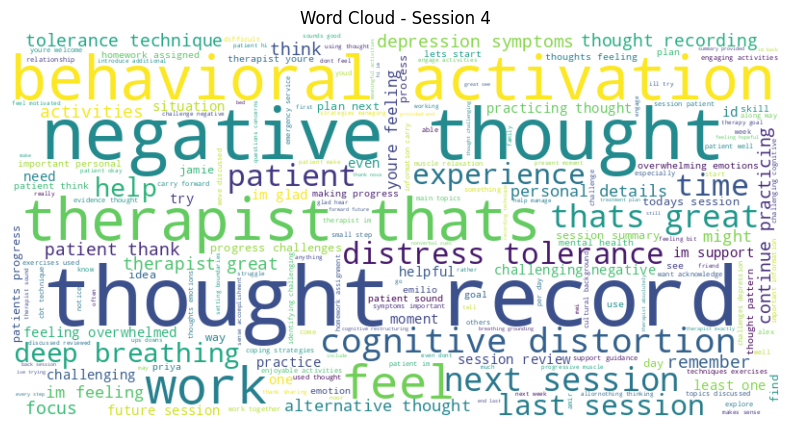

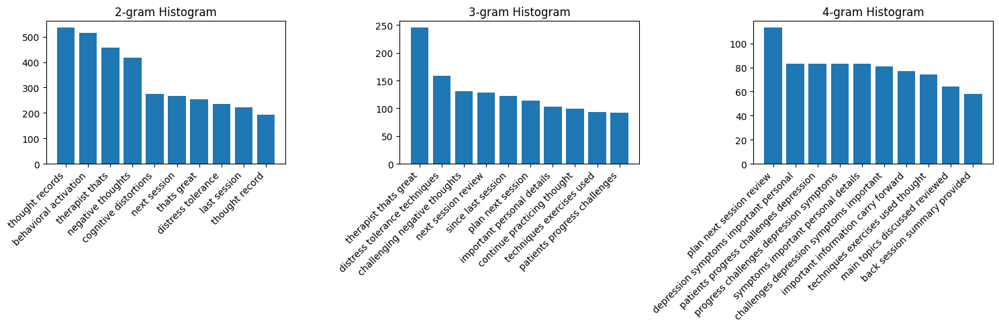

Session 5:
Number of words: 106116
Most frequent words: [('patient', 1662), ('thought', 1563), ('therapist', 1557), ('thoughts', 1449), ('im', 1234), ('like', 1036), ('techniques', 995), ('session', 941), ('feel', 743), ('activities', 717)]

Top 10 2-grams:
thought records: 665
behavioral activation: 509
negative thoughts: 502
therapist thats: 435
distress tolerance: 371
tolerance techniques: 305
deep breathing: 294
cognitive distortions: 285
thats great: 234
last session: 231

Top 10 3-grams:
distress tolerance techniques: 305
therapist thats great: 229
challenging negative thoughts: 143
next session review: 126
since last session: 126
plan next session: 114
important personal details: 104
techniques exercises used: 102
progressive muscle relaxation: 99
patients progress challenges: 97

Top 10 4-grams:
plan next session review: 112
patients progress challenges depression: 88
progress challenges depression symptoms: 88
depression symptoms important personal: 86
symptoms important perso

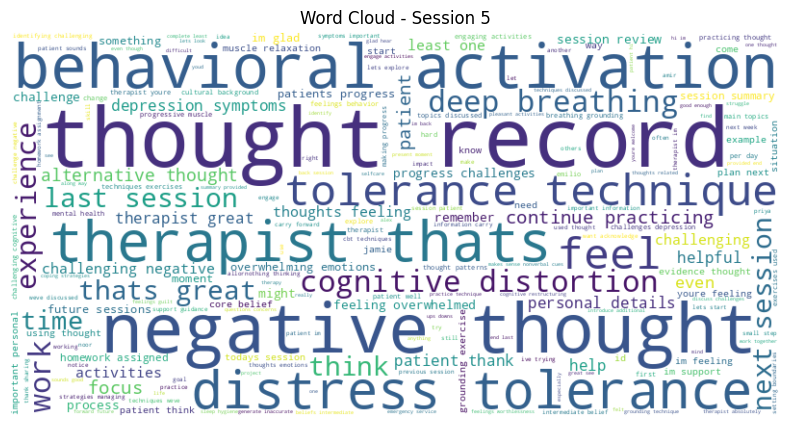

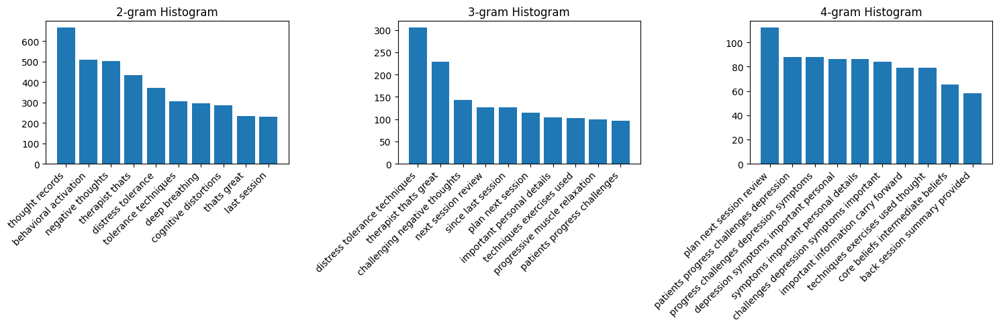

Session 6:
Number of words: 112649
Most frequent words: [('patient', 1774), ('thought', 1690), ('therapist', 1647), ('thoughts', 1454), ('im', 1274), ('like', 1116), ('techniques', 971), ('session', 963), ('feel', 853), ('practice', 798)]

Top 10 2-grams:
thought records: 736
negative thoughts: 493
therapist thats: 484
behavioral activation: 479
distress tolerance: 347
tolerance techniques: 289
deep breathing: 285
thats great: 269
last session: 261
cognitive distortions: 241

Top 10 3-grams:
distress tolerance techniques: 289
therapist thats great: 260
challenging negative thoughts: 144
since last session: 136
next session review: 124
progressive muscle relaxation: 122
plan next session: 115
techniques exercises used: 106
important personal details: 105
patients progress challenges: 101

Top 10 4-grams:
plan next session review: 112
patients progress challenges depression: 90
progress challenges depression symptoms: 90
depression symptoms important personal: 88
symptoms important perso

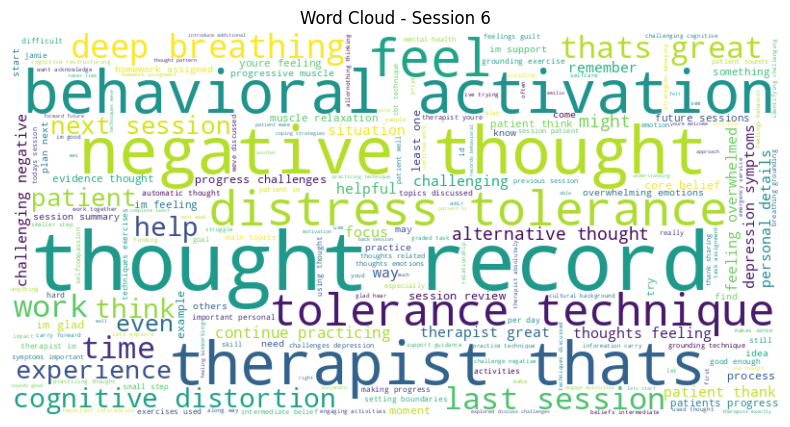

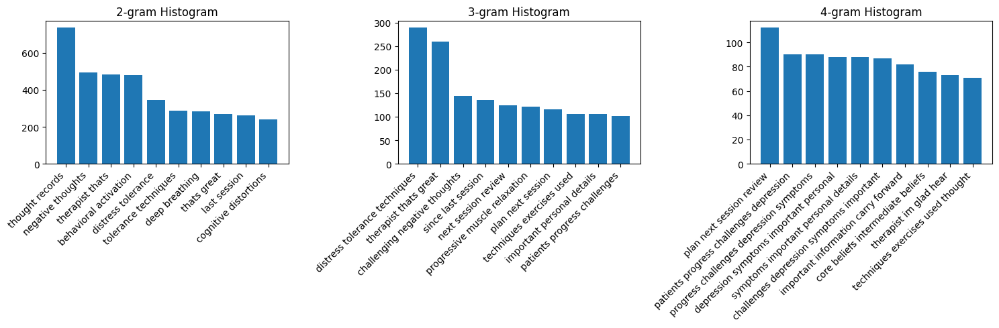

Session 7:
Number of words: 112322
Most frequent words: [('patient', 1752), ('therapist', 1611), ('thought', 1563), ('thoughts', 1425), ('im', 1357), ('like', 1132), ('techniques', 1040), ('session', 985), ('practice', 803), ('progress', 775)]

Top 10 2-grams:
thought records: 740
negative thoughts: 526
behavioral activation: 484
therapist thats: 470
distress tolerance: 380
tolerance techniques: 313
deep breathing: 283
thats great: 272
last session: 271
next session: 209

Top 10 3-grams:
distress tolerance techniques: 313
therapist thats great: 262
progressive muscle relaxation: 163
challenging negative thoughts: 157
since last session: 142
next session review: 117
plan next session: 115
techniques exercises used: 110
important personal details: 107
patients progress challenges: 106

Top 10 4-grams:
plan next session review: 113
patients progress challenges depression: 94
progress challenges depression symptoms: 94
challenges depression symptoms important: 92
depression symptoms import

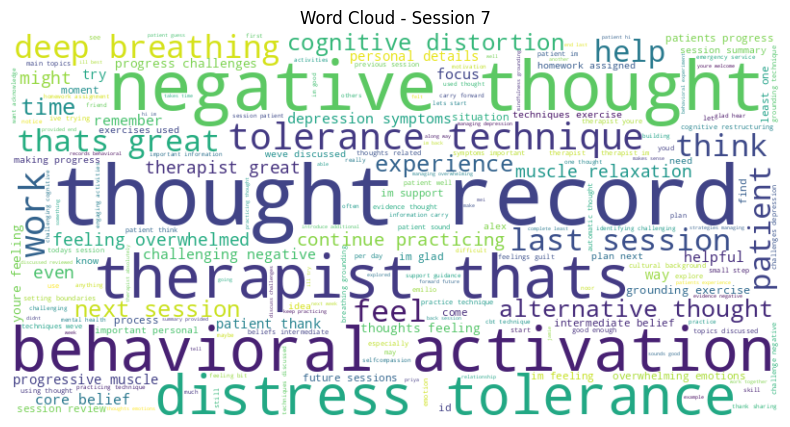

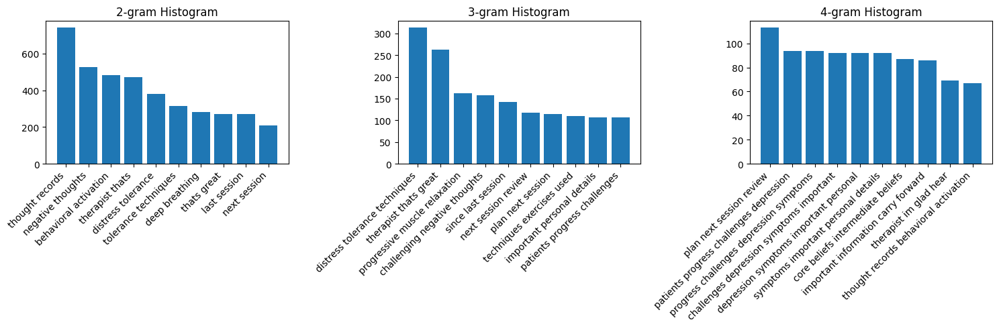

Session 8:
Number of words: 112370
Most frequent words: [('patient', 1986), ('therapist', 1848), ('thought', 1689), ('im', 1514), ('thoughts', 1506), ('like', 1192), ('session', 959), ('beliefs', 899), ('negative', 865), ('techniques', 826)]

Top 10 2-grams:
thought records: 711
negative thoughts: 577
therapist thats: 489
behavioral activation: 347
core beliefs: 307
distress tolerance: 252
last session: 252
thats great: 245
cognitive distortions: 242
next session: 236

Top 10 3-grams:
therapist thats great: 237
distress tolerance techniques: 219
challenging negative thoughts: 183
since last session: 135
progressive muscle relaxation: 119
plan next session: 118
next session review: 117
positive data log: 117
techniques exercises used: 112
important personal details: 108

Top 10 4-grams:
plan next session review: 113
core beliefs intermediate beliefs: 102
patients progress challenges depression: 96
progress challenges depression symptoms: 96
depression symptoms important personal: 94
sym

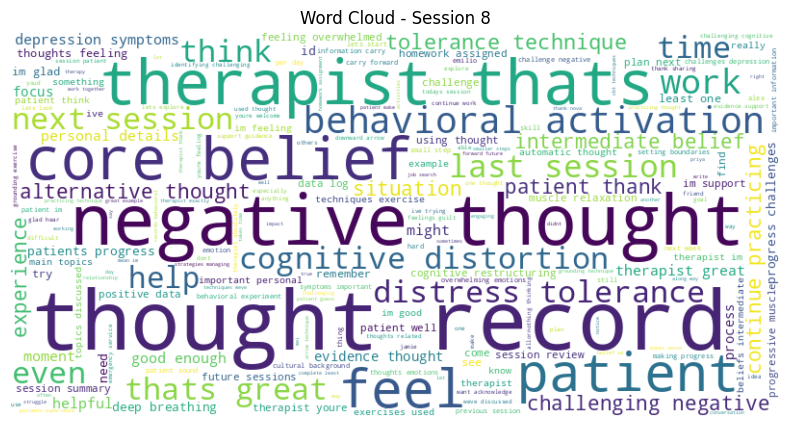

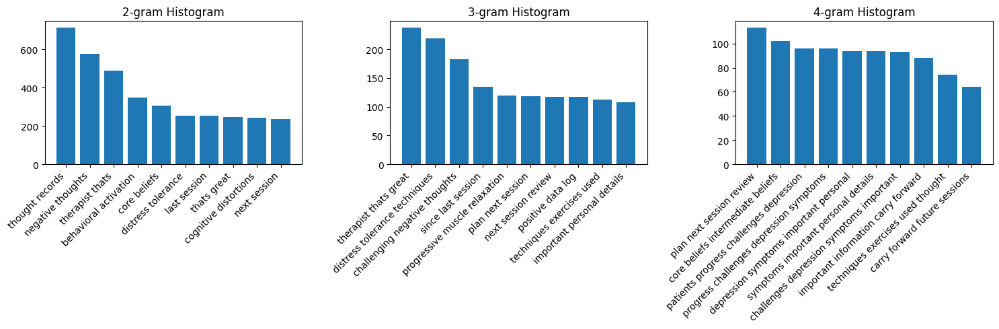

Session 9:
Number of words: 116398
Most frequent words: [('patient', 1865), ('thoughts', 1710), ('therapist', 1708), ('im', 1604), ('thought', 1601), ('like', 1171), ('negative', 1162), ('beliefs', 1088), ('session', 959), ('evidence', 862)]

Top 10 2-grams:
negative thoughts: 727
thought records: 676
therapist thats: 505
core beliefs: 410
core belief: 355
positive data: 305
data log: 304
thats great: 278
behavioral activation: 274
last session: 267

Top 10 3-grams:
positive data log: 304
therapist thats great: 275
challenging negative thoughts: 212
since last session: 148
im good enough: 145
plan next session: 118
beliefs intermediate beliefs: 116
next session review: 116
core beliefs intermediate: 114
techniques exercises used: 112

Top 10 4-grams:
core beliefs intermediate beliefs: 114
plan next session review: 111
patients progress challenges depression: 96
progress challenges depression symptoms: 96
depression symptoms important personal: 94
symptoms important personal details: 94

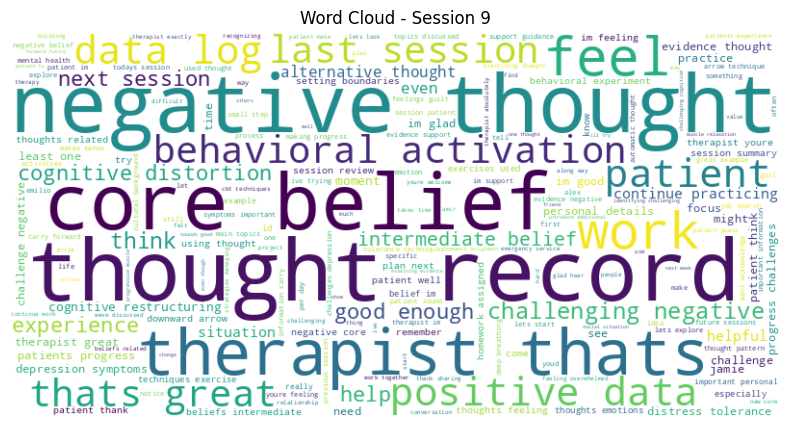

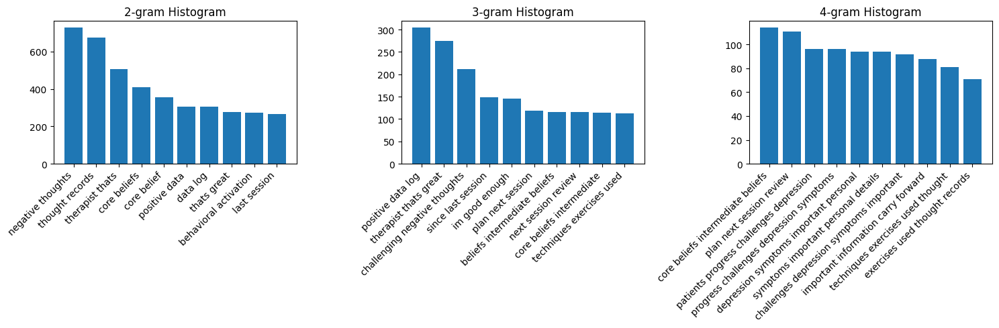

In [ ]:
# Load the JSON data
with open('Grouped_Sessions.json', 'r') as f:
    grouped_sessions = json.load(f)

# Loop through each session group
for session_data in grouped_sessions:
    session_number = session_data['session_group']
    session_text = session_data['combined_text']

    # Preprocessing: Remove signs and stop words
    session_text = re.sub(r'[^\w\s]', '', session_text)  # Remove signs
    tokens = word_tokenize(session_text.lower())  # Tokenize and lowercase
    tokens = [word for word in tokens if word not in stopwords.words('english')]  # Remove stop words

    # Session number and number of words
    print(f"Session {session_number}:")
    print(f"Number of words: {len(tokens)}")

    # Most frequent words
    fdist = FreqDist(tokens)
    common_words = fdist.most_common(10)  # Get top 10 common words
    print(f"Most frequent words: {common_words}")

    # N-gram Analysis with Text Output (n=2, 3, 4)
    for n in range(2, 5):  # For n = 2, 3, 4
        vectorizer = CountVectorizer(ngram_range=(n, n))
        X = vectorizer.fit_transform([' '.join(tokens)])
        ngram_freq = X.toarray().sum(axis=0)
        ngram_freq_dict = {ngram: freq for ngram, freq in zip(vectorizer.get_feature_names_out(), ngram_freq)}

        # Sort n-grams by frequency
        sorted_ngrams = sorted(ngram_freq_dict.items(), key=lambda item: item[1], reverse=True)[:10]  # Get top 10

        # Print n-gram frequencies
        print(f"\nTop 10 {n}-grams:")
        for ngram, freq in sorted_ngrams:
            print(f"{ngram}: {freq}")

    # Word Cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(tokens))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud - Session {session_number}")
    plt.show()

    # Create subplots for histograms
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

    # N-gram Analysis with Histograms (n=2, 3, 4)
    for i, n in enumerate([2, 3, 4]):
        vectorizer = CountVectorizer(ngram_range=(n, n))
        X = vectorizer.fit_transform([' '.join(tokens)])
        ngram_freq = X.toarray().sum(axis=0)
        ngram_freq_dict = {ngram: freq for ngram, freq in zip(vectorizer.get_feature_names_out(), ngram_freq)}

        # Sort n-grams by frequency
        sorted_ngrams = sorted(ngram_freq_dict.items(), key=lambda item: item[1], reverse=True)[:10]  # Get top 10

        # Create histogram in the corresponding subplot
        axes[i].bar(*zip(*sorted_ngrams))
        axes[i].set_xticks(range(len(sorted_ngrams)))  # Set x-axis ticks
        axes[i].set_xticklabels([ngram[0] for ngram in sorted_ngrams], rotation=45, ha='right')  # Set x-axis labels
        axes[i].set_title(f"{n}-gram Histogram")

    plt.tight_layout()  # Adjust layout for better readability
    plt.show()

## Phases analysis

In [ ]:
import json

def group_sessions_by_phase(input_file, output_file):
    """Group sessions by therapy phase and combine their texts."""
    with open(input_file, 'r') as f:
        sessions = json.load(f)

    # Define session ranges for each phase
    phases = {
        "assessment": range(1, 4),
        "initial": range(4, 8),
        "middle": range(8, 18),
        "termination": range(18, 21)
    }

    grouped_phases = {}  # Dictionary to store grouped phases

    for session in sessions:
        session_number = int(session['session_number']) if session['session_number'] != "unknown" else 1
        session_text = session['session_text']

        # Determine the phase for the current session
        for phase_name, session_range in phases.items():
            if session_number in session_range:
                phase = phase_name
                break
        else:
            phase = "unknown"  # Handle sessions outside the defined phases

        if phase not in grouped_phases:
            # Create a new entry for the phase group if it doesn't exist
            grouped_phases[phase] = {
                "phase_group": phase,
                "combined_text": ""
            }

        # Append the session text to the existing phase group
        grouped_phases[phase]["combined_text"] += session_text + "\n"

    # Prepare the final output format
    final_output = [{"phase_group": group["phase_group"], "combined_text": group["combined_text"].strip()}
                    for group in grouped_phases.values()]

    with open(output_file, 'w') as f:
        json.dump(final_output, f, indent=4)

    print(f"Successfully grouped sessions by phase and saved to {output_file}")

if __name__ == "__main__":
    input_file = 'Combined_Synthetic_Transcripts_Nov_2.json'
    output_file = 'Grouped_Phases.json'  # New output file name
    group_sessions_by_phase(input_file, output_file)

Successfully grouped sessions by phase and saved to Grouped_Phases.json



--- ASSESSMENT PHASE ---
Number of words: 243307
Most frequent words: [('patient', 3849), ('therapist', 3829), ('thought', 3817), ('im', 3805), ('thoughts', 3242), ('like', 2696), ('work', 2317), ('depression', 2235), ('negative', 2182), ('session', 2168)]

Top 10 2-grams:
negative thoughts: 1179
thought record: 1000
cognitive distortions: 939
therapist thats: 909
next session: 823
thought patterns: 723
work together: 674
negative thought: 600
id like: 593
thats great: 556

Top 10 3-grams:
therapist thats great: 527
negative thought patterns: 395
thoughts feelings behaviors: 362
challenging negative thoughts: 322
next session review: 300
plan next session: 269
therapist im glad: 261
important personal details: 233
patient sounds good: 232
techniques exercises used: 212

Top 10 4-grams:
plan next session review: 255
symptoms important personal details: 196
depression symptoms important personal: 194
challenges depression symptoms important: 193
patients progress challenges depression: 

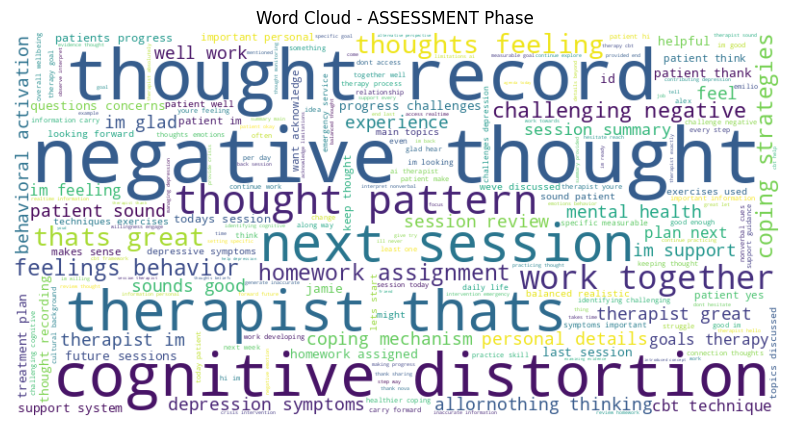

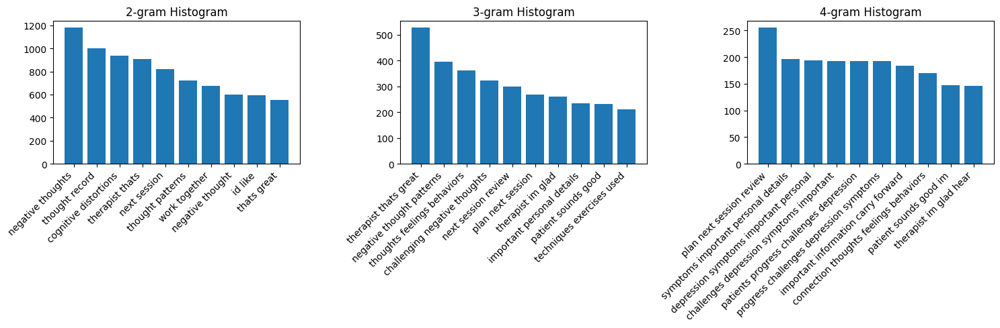


--- MIDDLE PHASE ---
Number of words: 1152326
Most frequent words: [('patient', 18906), ('therapist', 17317), ('thoughts', 16784), ('im', 16284), ('thought', 15941), ('like', 11416), ('beliefs', 11151), ('negative', 10813), ('session', 10011), ('evidence', 8432)]

Top 10 2-grams:
thought records: 6955
negative thoughts: 6751
therapist thats: 5107
core beliefs: 4004
positive data: 3834
data log: 3818
core belief: 3670
thats great: 2736
last session: 2711
challenging negative: 2454

Top 10 3-grams:
positive data log: 3818
therapist thats great: 2668
challenging negative thoughts: 1883
im good enough: 1496
since last session: 1486
beliefs intermediate beliefs: 1197
core beliefs intermediate: 1182
plan next session: 1170
next session review: 1149
downward arrow technique: 1126

Top 10 4-grams:
core beliefs intermediate beliefs: 1182
plan next session review: 1085
patients progress challenges depression: 956
progress challenges depression symptoms: 956
depression symptoms important persona

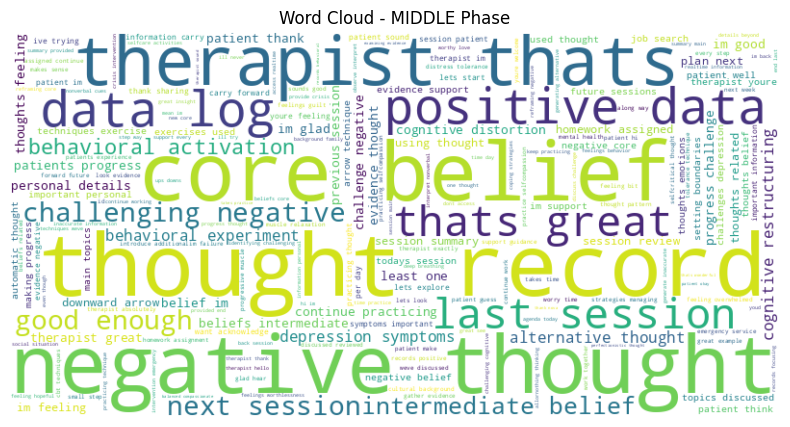

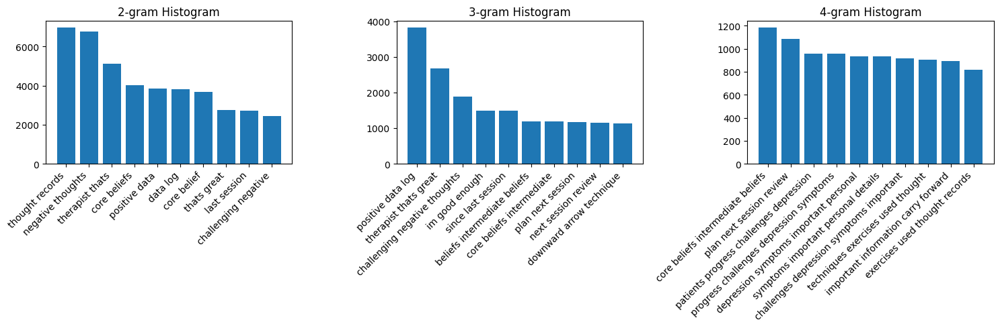


--- TERMINATION PHASE ---
Number of words: 359408
Most frequent words: [('patient', 5637), ('therapist', 5347), ('im', 4800), ('thoughts', 4635), ('progress', 4042), ('like', 3586), ('thought', 3554), ('session', 3041), ('support', 2913), ('negative', 2534)]

Top 10 2-grams:
thought records: 1818
negative thoughts: 1725
therapist thats: 1485
coping cards: 1316
core beliefs: 983
data log: 964
positive data: 964
core belief: 922
relapse prevention: 786
last session: 758

Top 10 3-grams:
positive data log: 964
therapist thats great: 670
challenging negative thoughts: 566
relapse prevention plan: 553
since last session: 421
wellness action plan: 408
plan next session: 370
beliefs intermediate beliefs: 368
core beliefs intermediate: 368
patients progress challenges: 356

Top 10 4-grams:
core beliefs intermediate beliefs: 368
patients progress challenges depression: 288
progress challenges depression symptoms: 288
depression symptoms important personal: 281
symptoms important personal detai

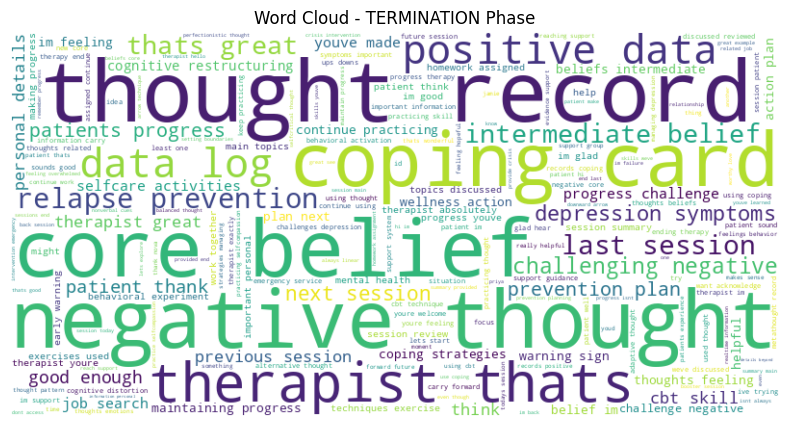

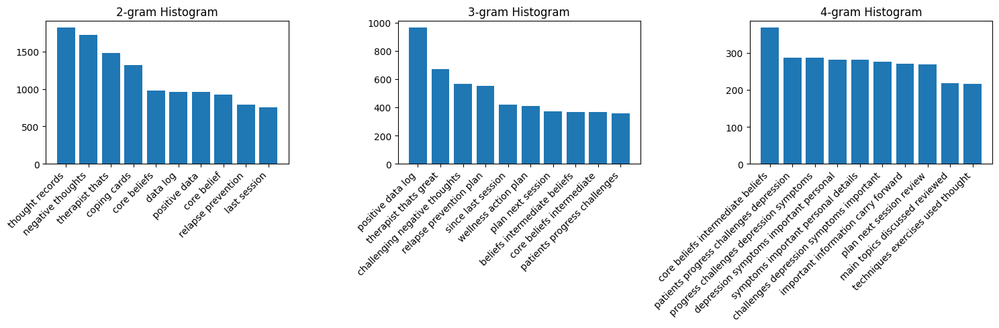


--- INITIAL PHASE ---
Number of words: 435713
Most frequent words: [('patient', 6921), ('thought', 6415), ('therapist', 6410), ('thoughts', 5460), ('im', 5091), ('like', 4343), ('session', 3832), ('techniques', 3776), ('feel', 3155), ('practice', 2976)]

Top 10 2-grams:
thought records: 2676
behavioral activation: 1986
negative thoughts: 1939
therapist thats: 1847
distress tolerance: 1334
tolerance techniques: 1065
deep breathing: 1049
thats great: 1029
cognitive distortions: 1007
last session: 986

Top 10 3-grams:
distress tolerance techniques: 1065
therapist thats great: 996
challenging negative thoughts: 575
since last session: 526
next session review: 495
plan next session: 458
progressive muscle relaxation: 457
important personal details: 419
techniques exercises used: 411
patients progress challenges: 396

Top 10 4-grams:
plan next session review: 450
patients progress challenges depression: 355
progress challenges depression symptoms: 355
depression symptoms important personal:

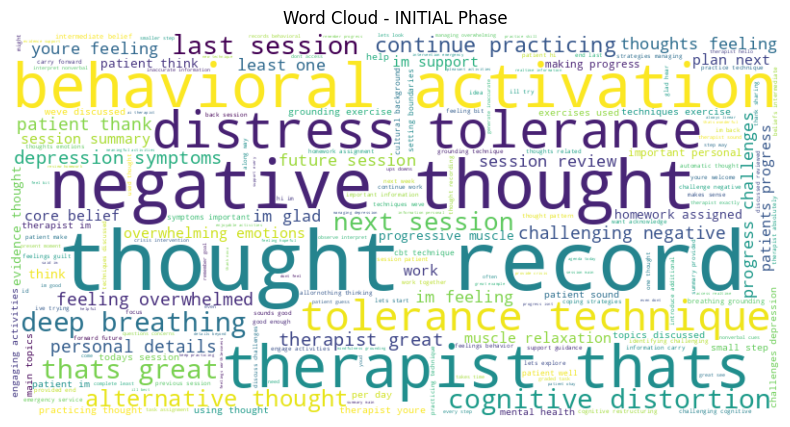

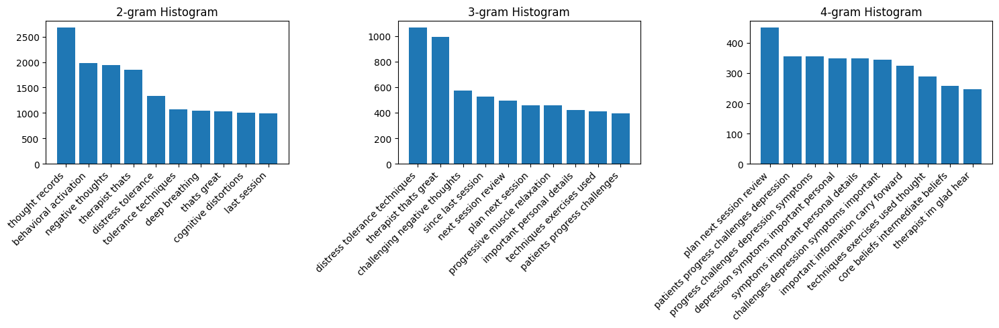

In [ ]:


# Load the JSON data
with open('Grouped_Phases.json', 'r') as f:
    grouped_phases = json.load(f)

# Loop through each phase group
for phase_data in grouped_phases:
    phase_name = phase_data['phase_group']
    phase_text = phase_data['combined_text']

    # Preprocessing: Remove signs and stop words
    phase_text = re.sub(r'[^\w\s]', '', phase_text)  # Remove signs
    tokens = word_tokenize(phase_text.lower())  # Tokenize and lowercase
    tokens = [word for word in tokens if word not in stopwords.words('english')]  # Remove stop words

    # Phase statistics
    print(f"\n--- {phase_name.upper()} PHASE ---")
    print(f"Number of words: {len(tokens)}")

    # Most frequent words
    fdist = FreqDist(tokens)
    common_words = fdist.most_common(10)  # Get top 10 common words
    print(f"Most frequent words: {common_words}")

    # N-gram Analysis with Text Output (n=2, 3, 4)
    for n in range(2, 5):  # For n = 2, 3, 4
        vectorizer = CountVectorizer(ngram_range=(n, n))
        X = vectorizer.fit_transform([' '.join(tokens)])
        ngram_freq = X.toarray().sum(axis=0)
        ngram_freq_dict = {ngram: freq for ngram, freq in zip(vectorizer.get_feature_names_out(), ngram_freq)}

        # Sort n-grams by frequency
        sorted_ngrams = sorted(ngram_freq_dict.items(), key=lambda item: item[1], reverse=True)[:10]  # Get top 10

        # Print n-gram frequencies
        print(f"\nTop 10 {n}-grams:")
        for ngram, freq in sorted_ngrams:
            print(f"{ngram}: {freq}")

    # Word Cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(tokens))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud - {phase_name.upper()} Phase")
    plt.show()

    # Create subplots for histograms
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

    # N-gram Analysis with Histograms (n=2, 3, 4)
    for i, n in enumerate([2, 3, 4]):
        vectorizer = CountVectorizer(ngram_range=(n, n))
        X = vectorizer.fit_transform([' '.join(tokens)])
        ngram_freq = X.toarray().sum(axis=0)
        ngram_freq_dict = {ngram: freq for ngram, freq in zip(vectorizer.get_feature_names_out(), ngram_freq)}

        # Sort n-grams by frequency
        sorted_ngrams = sorted(ngram_freq_dict.items(), key=lambda item: item[1], reverse=True)[:10]  # Get top 10

        # Create histogram in the corresponding subplot
        axes[i].bar(*zip(*sorted_ngrams))
        axes[i].set_xticks(range(len(sorted_ngrams)))  # Set x-axis ticks
        axes[i].set_xticklabels([ngram[0] for ngram in sorted_ngrams], rotation=45, ha='right')  # Set x-axis labels
        axes[i].set_title(f"{n}-gram Histogram")

    plt.tight_layout()  # Adjust layout for better readability
    plt.show()

## Summerzing and comparing the most common words for combined text

In [ ]:

def get_most_common_words(text, num_words=10):
    """
    Extracts the most common words from a text after preprocessing.

    Args:
        text (str): The input text.
        num_words (int, optional): The number of most common words to extract. Defaults to 10.

    Returns:
        list: A list of tuples, where each tuple contains a word and its frequency.
    """
    text = re.sub(r'[^\w\s]', '', text)  # Remove signs
    tokens = word_tokenize(text.lower())  # Tokenize and lowercase
    tokens = [word for word in tokens if word not in stopwords.words('english')]  # Remove stop words
    fdist = FreqDist(tokens)
    return fdist.most_common(num_words)


# --- Combined Text Analysis ---
with open('Combined_Synthetic_Transcripts_Nov_2.txt', 'r') as file:
    combined_text = file.read()

common_words_combined = get_most_common_words(combined_text)
print("\n--- Most Common Words (Combined Text) ---")
print(common_words_combined)


# --- Phase-Based Analysis ---
with open('Grouped_Phases.json', 'r') as file:
    grouped_phases = json.load(file)

print("\n--- Most Common Words (Phase-Based) ---")
for phase_data in grouped_phases:
    phase_name = phase_data['phase_group']
    phase_text = phase_data['combined_text']
    common_words_phase = get_most_common_words(phase_text)
    print(f"\nPhase: {phase_name.upper()}")
    print(common_words_phase)


# --- Session-Based Analysis ---
with open('Grouped_Sessions.json', 'r') as file:
    grouped_sessions = json.load(file)

print("\n--- Most Common Words (Session-Based) ---")
for session_data in grouped_sessions:
    session_number = session_data['session_group']
    session_text = session_data['combined_text']
    common_words_session = get_most_common_words(session_text)
    print(f"\nSession: {session_number}")
    print(common_words_session)


--- Most Common Words (Combined Text) ---
[('patient', 35313), ('therapist', 32903), ('thoughts', 30121), ('im', 29980), ('thought', 29727), ('like', 22041), ('session', 19052), ('negative', 18259), ('progress', 15897), ('beliefs', 15273)]

--- Most Common Words (Phase-Based) ---

Phase: ASSESSMENT
[('patient', 3849), ('therapist', 3829), ('thought', 3817), ('im', 3805), ('thoughts', 3242), ('like', 2696), ('work', 2317), ('depression', 2235), ('negative', 2182), ('session', 2168)]

Phase: MIDDLE
[('patient', 18906), ('therapist', 17317), ('thoughts', 16784), ('im', 16284), ('thought', 15941), ('like', 11416), ('beliefs', 11151), ('negative', 10813), ('session', 10011), ('evidence', 8432)]

Phase: TERMINATION
[('patient', 5637), ('therapist', 5347), ('im', 4800), ('thoughts', 4635), ('progress', 4042), ('like', 3586), ('thought', 3554), ('session', 3041), ('support', 2913), ('negative', 2534)]

Phase: INITIAL
[('patient', 6921), ('thought', 6415), ('therapist', 6410), ('thoughts', 546

In [ ]:
def get_most_common_ngrams(text, n, num_ngrams=10):
    """
    Extracts the most common n-grams from a text after preprocessing.

    Args:
        text (str): The input text.
        n (int): The n-gram size (e.g., 2 for bigrams, 3 for trigrams).
        num_ngrams (int, optional): The number of most common n-grams to extract. Defaults to 10.

    Returns:
        list: A list of tuples, where each tuple contains an n-gram and its frequency.
    """
    text = re.sub(r'[^\w\s]', '', text)  # Remove signs
    tokens = word_tokenize(text.lower())  # Tokenize and lowercase
    tokens = [word for word in tokens if word not in stopwords.words('english')]  # Remove stop words

    vectorizer = CountVectorizer(ngram_range=(n, n))
    X = vectorizer.fit_transform([' '.join(tokens)])
    ngram_freq = X.toarray().sum(axis=0)
    ngram_freq_dict = {ngram: freq for ngram, freq in zip(vectorizer.get_feature_names_out(), ngram_freq)}

    # Sort n-grams by frequency
    sorted_ngrams = sorted(ngram_freq_dict.items(), key=lambda item: item[1], reverse=True)[:num_ngrams]

    return sorted_ngrams


# --- Combined Text Analysis ---
with open('Combined_Synthetic_Transcripts_Nov_2.txt', 'r') as file:
    combined_text = file.read()

for n in [2, 3]:  # Analyze 2-grams and 3-grams
    common_ngrams_combined = get_most_common_ngrams(combined_text, n)
    print(f"\n--- Most Common {n}-grams (Combined Text) ---")
    print(common_ngrams_combined)


# --- Phase-Based Analysis ---
with open('Grouped_Phases.json', 'r') as file:
    grouped_phases = json.load(file)

print("\n--- Most Common N-grams (Phase-Based) ---")
for phase_data in grouped_phases:
    phase_name = phase_data['phase_group']
    phase_text = phase_data['combined_text']
    for n in [2, 3]:
        common_ngrams_phase = get_most_common_ngrams(phase_text, n)
        print(f"\nPhase: {phase_name.upper()} ({n}-grams)")
        print(common_ngrams_phase)


# --- Session-Based Analysis ---
with open('Grouped_Sessions.json', 'r') as file:
    grouped_sessions = json.load(file)

print("\n--- Most Common N-grams (Session-Based) ---")
for session_data in grouped_sessions:
    session_number = session_data['session_group']
    session_text = session_data['combined_text']
    for n in [2, 3]:
        common_ngrams_session = get_most_common_ngrams(session_text, n)
        print(f"\nSession: {session_number} ({n}-grams)")
        print(common_ngrams_session)



--- Most Common 2-grams (Combined Text) ---
[('thought records', 11946), ('negative thoughts', 11594), ('therapist thats', 9348), ('core beliefs', 5386), ('thats great', 5036), ('behavioral activation', 4852), ('positive data', 4798), ('data log', 4782), ('last session', 4699), ('next session', 4674)]

--- Most Common 3-grams (Combined Text) ---
[('therapist thats great', 4861), ('positive data log', 4782), ('challenging negative thoughts', 3346), ('since last session', 2456), ('plan next session', 2267), ('next session review', 2219), ('im good enough', 2151), ('techniques exercises used', 2096), ('patients progress challenges', 2065), ('main topics discussed', 2039)]

--- Most Common N-grams (Phase-Based) ---

Phase: ASSESSMENT (2-grams)
[('negative thoughts', 1179), ('thought record', 1000), ('cognitive distortions', 939), ('therapist thats', 909), ('next session', 823), ('thought patterns', 723), ('work together', 674), ('negative thought', 600), ('id like', 593), ('thats great', 